# Estrategias para preparación de datos y enfoques de problemas

### 0. Instalación e importación de librerías 

In [2]:
# Manejo de datos/dataframes
!pip install pandas

# Jupyter 
!pip install ipywidgets

# Cálculo, Estadística, ML...
!pip install scipy
!pip install scikit-learn

# Visualizacion
!pip install matplotlib
!pip install seaborn
!pip install plotly==5.18.0
#* Requisito para ploty
!pip install nbformat>=4.2.0

# Automated EDA
!pip install ydata-profiling
!pip install sweetviz

zsh:1: 4.2.0 not found


In [3]:
import warnings
from scipy import stats

import pandas as pd
from pandas import DataFrame
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Solamente para evitar warnings de la libreria seaborn
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")

In [5]:
# Semilla para obtener mismos resultados en métodos/funciones que utilicen selecciones aleatorias: "random_seed" o similar.
SEED = 1234

## 1. Carga de datos
- Para poder comenzar la preparación de datos necesitamos cargarlos.
- **Importance explorar los datos antes si es posible** (Desde Excel, bloc de notas, etc.).
- Saber detalles previos como su formato, como se separan los datos, etc. facilitaran su carga.
- Si el conjunto total de datos no es posible cargarlo en memoria, realizar la exploración inicial con una muestra representativa.
- **Mas detalles en el fastbook.**
- Tipos comunes de datos:
  - .csv:  comma separated values: .read_csv()
  - .json: JavaScript Object Notation (dictionary like): .read_json()
  - .parquet: formato tabular de Apache:  .read_parquet()
etc.

  - [guia extensa de lectura de cualquier tipo de archivo](https://realpython.com/pandas-read-write-files/)

In [193]:
df = pd.read_csv('data/avocado.csv')

In [ ]:
help(pd.read_csv)

 ## 2. Previsualización de los datos o Data previsualization
- Para tener una vista y comprensión rápida de los datos a tratar: tipo, tamaño, numero de campos, etc.
    - .shape
    - .head()
    - .tail()
    - .sample()
    - .dtypes


In [85]:
df.shape

(18249, 14)

In [9]:
len(df)

18249

In [10]:
df.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [83]:
df.tail()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,AverragePrice
18244,7,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico,NaN
18245,8,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico,NaN
18246,9,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico,NaN
18247,10,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico,NaN
18248,11,2018-01-07,1.62,17489.58,2894.77,2356.13,224.53,12014.15,11988.14,26.01,0.0,organic,2018,WestTexNewMexico,NaN


In [12]:
df.sample(n=5, random_state=SEED)

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
15766,18,2017-08-27,1.62,8228.93,106.71,1378.46,0.00,6743.76,4350.93,2392.83,0.00,organic,2017,Indianapolis
8456,31,2017-05-28,0.91,1042737.97,586236.26,88983.48,15734.13,351784.10,139601.56,212182.54,0.00,conventional,2017,WestTexNewMexico
622,50,2015-01-11,0.76,1128693.04,680572.11,348535.22,11900.83,87684.88,67857.83,19801.95,25.10,conventional,2015,DallasFtWorth
8095,41,2017-03-19,1.45,3168368.37,1643034.48,443255.67,4278.48,1077799.74,685021.63,374167.84,18610.27,conventional,2017,Southeast
13035,10,2016-10-16,2.85,4317.31,707.37,2855.90,0.00,754.04,732.85,21.19,0.00,organic,2016,LasVegas


In [13]:
df.dtypes

Unnamed: 0        int64
Date             object
AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type             object
year              int64
region           object
dtype: object

In [14]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 5.0 MB


In [15]:
df.memory_usage(deep=True).sum() / 1000

5270.366

In [131]:
df.memory_usage(deep=True).sum()  / (1024 * 1024)


5.668978691101074

In [86]:
# variable guardada para más adelante
type = df["type"].unique().tolist()
region = df["region"].unique().tolist()
type, region



(['conventional', 'organic'],
 ['Albany',
  'Atlanta',
  'BaltimoreWashington',
  'Boise',
  'Boston',
  'BuffaloRochester',
  'California',
  'Charlotte',
  'Chicago',
  'CincinnatiDayton',
  'Columbus',
  'DallasFtWorth',
  'Denver',
  'Detroit',
  'GrandRapids',
  'GreatLakes',
  'HarrisburgScranton',
  'HartfordSpringfield',
  'Houston',
  'Indianapolis',
  'Jacksonville',
  'LasVegas',
  'LosAngeles',
  'Louisville',
  'MiamiFtLauderdale',
  'Midsouth',
  'Nashville',
  'NewOrleansMobile',
  'NewYork',
  'Northeast',
  'NorthernNewEngland',
  'Orlando',
  'Philadelphia',
  'PhoenixTucson',
  'Pittsburgh',
  'Plains',
  'Portland',
  'RaleighGreensboro',
  'RichmondNorfolk',
  'Roanoke',
  'Sacramento',
  'SanDiego',
  'SanFrancisco',
  'Seattle',
  'SouthCarolina',
  'SouthCentral',
  'Southeast',
  'Spokane',
  'StLouis',
  'Syracuse',
  'Tampa',
  'TotalUS',
  'West',
  'WestTexNewMexico'])

- Datos numéricos y categóricos y fecha.
- Bajo número de campos (14).
- Medio número de filas (18249).

### Analisis exploratorio de los datos
- Conocer más en detalle los datos: métricas estadísticas, frecuencia, distribución, etc.
  - .describe()

In [87]:
df.describe(include=np.number).T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,18249.0,24.232232,1.548104e+01,0.00,10.00,24.00,38.00,52.00
AveragePrice,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25
Total Volume,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52
4046,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17
4225,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61
4770,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11
Total Bags,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37
Small Bags,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80
Large Bags,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61
XLarge Bags,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65


- length and body mass have different data ranges

In [194]:
df.describe(include='O').T

,count,unique,top,freq
Date,18249,169,2015-12-27,108
type,18249,2,conventional,9126
region,18249,54,Albany,338


- Type tiene dos valores
- Region tiene 54 valores
- Date tiene 169 valores

#### Visualizacion
- Conocer la distribución de los datos, relaciones lineales o no lineales, etc.
  - .plot(): kind='bar'/'line'/'scatter'/...
  - .hist(), etc.
  - Matplotlib
  - Seaborn

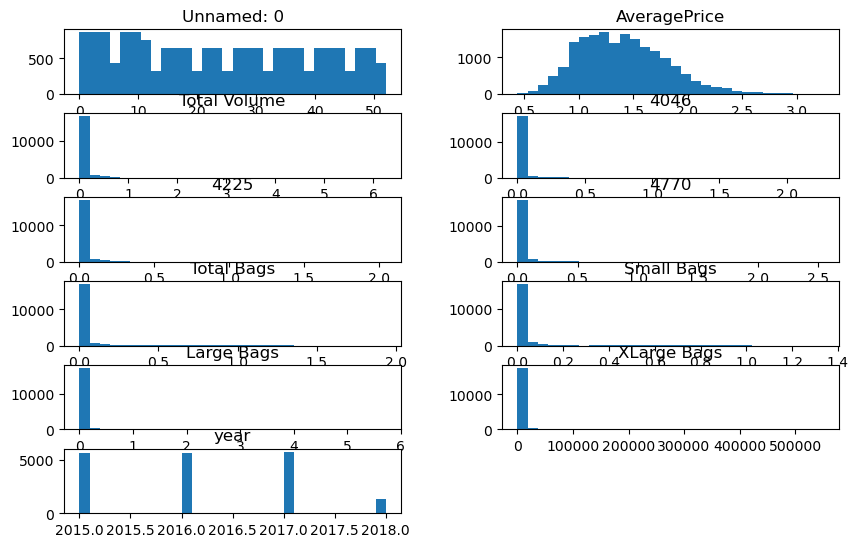

In [22]:
df.hist(layout=(14, 2), figsize=(10, 15),  grid=False, bins=30);

- Diferentes tipos de distribución: normal, sesgada/skewed, bimodal?

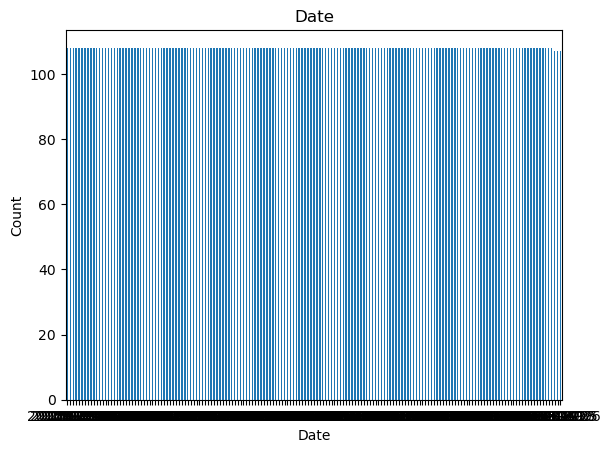

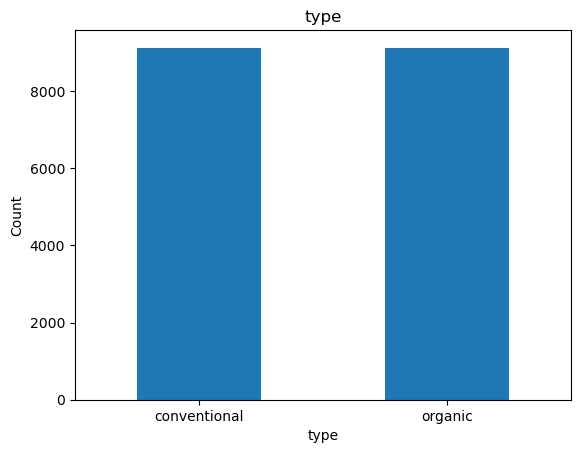

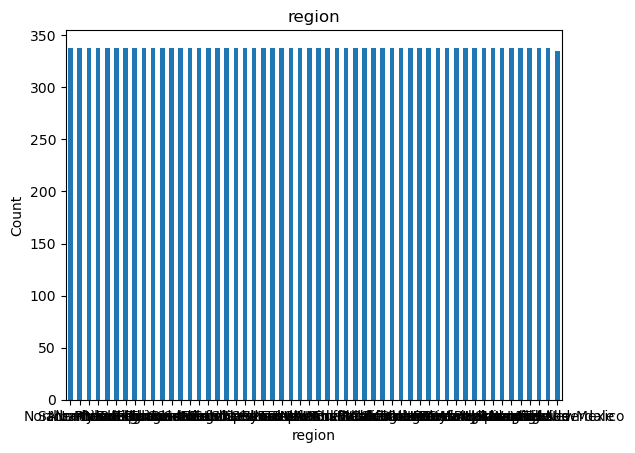

In [23]:
for cat_col in df.select_dtypes(include='O').columns.tolist():
    df[cat_col].value_counts().plot(kind='bar', rot=0).set_title(cat_col)
    plt.ylabel('Count')
    plt.show()

- categorias balanceadas en orgánico y convencional

#### Recursos para EDA (Exploración de datos analítica)

[Matplotlib Cheatseets](https://matplotlib.org/cheatsheets/)

[Pandas Cheatseets](https://dfedorov.spb.ru/pandas/cheatsheet/Enthought-v1.0.2.pdf)

<img src="https://imgv2-1-f.scribdassets.com/img/document/383895387/original/f03d59526b/1699542817?v=1" width="800">


<img src="https://matplotlib.org/cheatsheets/_images/handout-beginner.png" width="800">



<img src="https://matplotlib.org/cheatsheets/_images/cheatsheets-1.png" width="1300">

#### Exploradores de datos automatizados
- ydata_profiling
- sweetviz
- etc.

In [24]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="EDA")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
import sweetviz as sv

analyze_report = sv.analyze(df)
analyze_report.show_html('report.html', open_browser=True)

                                             |          | [  0%]   00:00 -> (? left)

Report report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [26]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

## 3. Data Profiling & Data Cleaning
- Perfilado de datos o Data Profiling: búsqueda de errores, inconsistencias, etc. dentro del conjunto de datos.
- Limpieza de datos o Data Cleaning: corrección/limpieza del conjunto de datos.

### 3.1. Valors faltantes o *Missing data*

- Los valores faltantes o *missing data* son aquellos valores que se encuentran ausentes dentro de su respectiva fila/entrada de datos y columna/variable/feature en un dataset. 
- Nomenclatura típica de datos faltantes: None, NaN, NAN, <NaN>, <NAN>, NaT, '', ' ' 
  - .isna()
  
*NAN: Not a Number*

In [88]:
df.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [196]:
# isna() devuelve la comprobación de si un dato es faltante (NaN) o no con "True" o "False"
df.isna().head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [195]:
df[df.isna()].head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [197]:
df.loc[0,"AveragePrice"]=np.nan
print('NaN value: ', df[df.isna()].region.values[0])
print('type', type(df[df.isna()].region.values[0]))

NaN value:  nan


TypeError: 'list' object is not callable

#### 3.1.1. Información de valores faltantes
- isna().sum()

In [198]:
df.isna().sum()

Unnamed: 0      0
Date            0
AveragePrice    1
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

In [199]:
df.isna().sum().sum()

1

In [200]:
round(df.isna().mean() * 100, 2)

Unnamed: 0      0.00
Date            0.00
AveragePrice    0.01
Total Volume    0.00
4046            0.00
4225            0.00
4770            0.00
Total Bags      0.00
Small Bags      0.00
Large Bags      0.00
XLarge Bags     0.00
type            0.00
year            0.00
region          0.00
dtype: float64

#### 3.1.2. Opcion 1: Eliminar filas que contienen datos faltantes
- dropna()

NO HAY DATOS FALTANTES

In [202]:
df[df['AveragePrice'].isna()].head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,NaN,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany


In [203]:
# dropna(): elimina filas con datos faltantes
df.dropna(axis=0).isna().sum()

Unnamed: 0      0
Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

In [204]:
df.dropna(axis=0)[df['AveragePrice'].isna()].head()

/var/folders/4_/ktqvdskd17d99s6ddpc3_6th0000gp/T/ipykernel_59428/1635051818.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df.dropna(axis=0)[df['AveragePrice'].isna()].head()


,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region


#### 3.1.2. Opcion 2: Imputar valores faltantes
- Imputacion: consiste en el reemplazo de datos faltantes por otros. 
- Se suelen utilizar diferentes estrategias: cero, media, mediana, iterativa etc.
  - .fillna()

In [205]:
# select_dtypes: seleccionar solo los campos deseados
df.select_dtypes(include=np.number).fillna(df.select_dtypes(include=np.number).mean()).isna().sum()
# example with one column: df['culmen_length_mm'] = df['culmen_length_mm'].fillna(df['culmen_length_mm'].mean())

Unnamed: 0      0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
year            0
dtype: int64

In [206]:
df.select_dtypes(include=np.number)[df['AveragePrice'].isna()].head(10)

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
0,0,NaN,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,2015


In [207]:
df.select_dtypes(include=np.number).fillna(df.select_dtypes(include=np.number).median())[df['AveragePrice'].isna()].head(2)

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
0,0,1.37,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,2015


In [208]:
df.select_dtypes(include=np.number).fillna(0)[df['AveragePrice'].isna()].head(2)

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
0,0,0.0,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,2015


#### Solución final elegida: eliminar todos los datos faltantes

In [209]:
# inplace: aplicar la funcion de Pandas sin necesidad de sobreescribir la variable del DataFrame.
df.dropna(axis=0, inplace=True)

### 3.2. Outliers


- Valores extremos.
- Difieren significativamente  del resto del conjunto de datos en cuanto a situarse a una distancia “anormal”.
- Su origen puede ser natural o artificial

#### 3.2.1. Detección de Outliers

##### Z-score
- Método estadístico que describe la relación que tienen los valores con la media del conjunto, midiéndose con el número de desviaciones estándar a esa media.
- El Z-score es igual a cero cuando x = μ (idéntico a la media)
- El Z-score es ± 1, ± 2, or ± 3, dependiendo de si x es ± 1, ± 2, or ± 3, respectivamente (el valor se encuentra a ± 1, ± 2, or ± 3 desviaciones estándar de la media).
- Este método asume una distribución normal.




<img src="https://sugermint.com/wp-content/uploads/2023/01/How-Do-Confidence-Intervals-Affect-the-Z-Score.jpg" width="600">

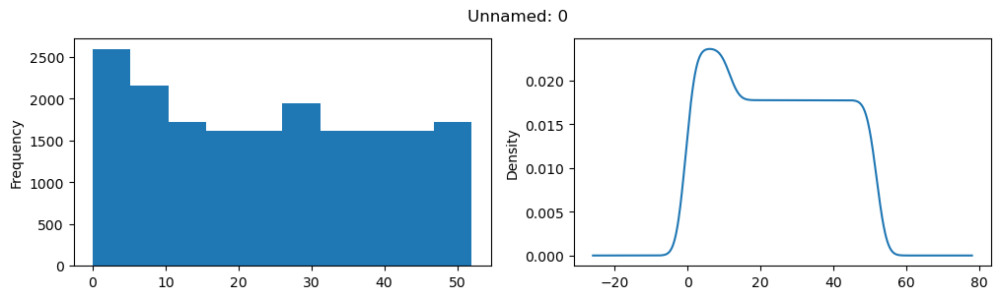

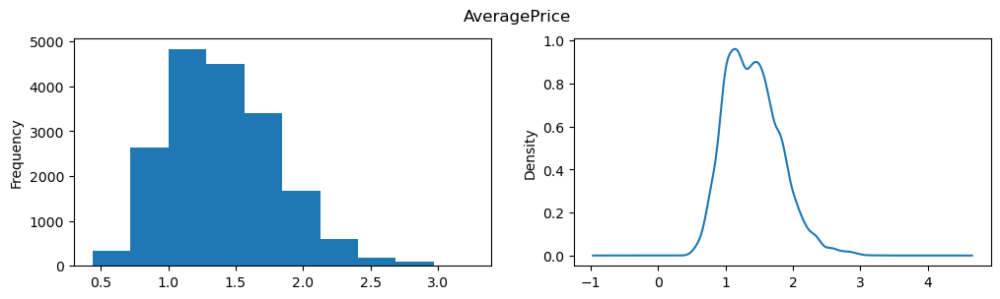

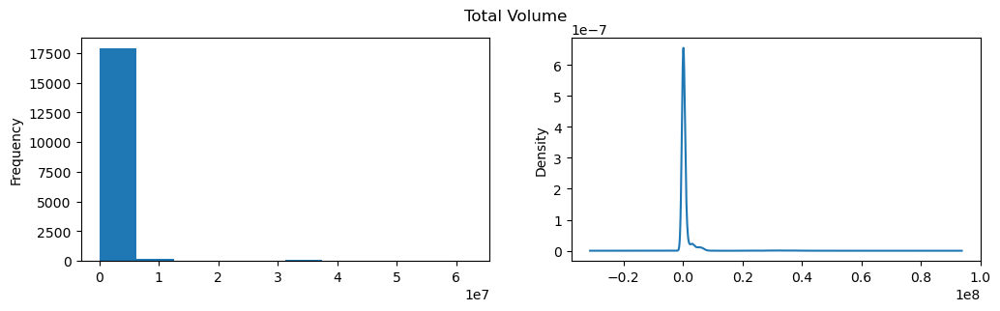

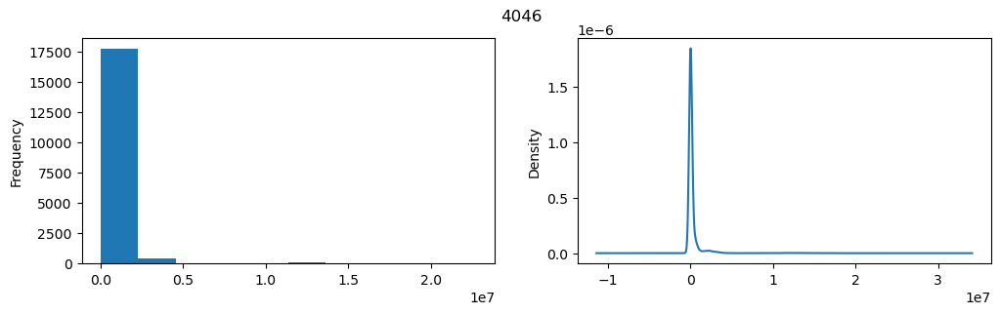

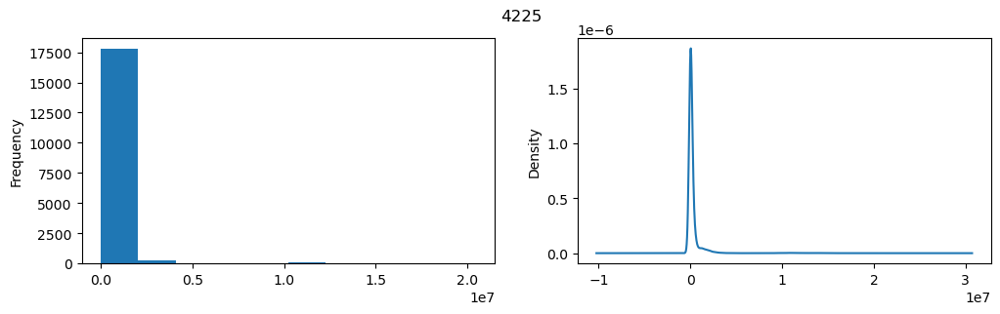

...

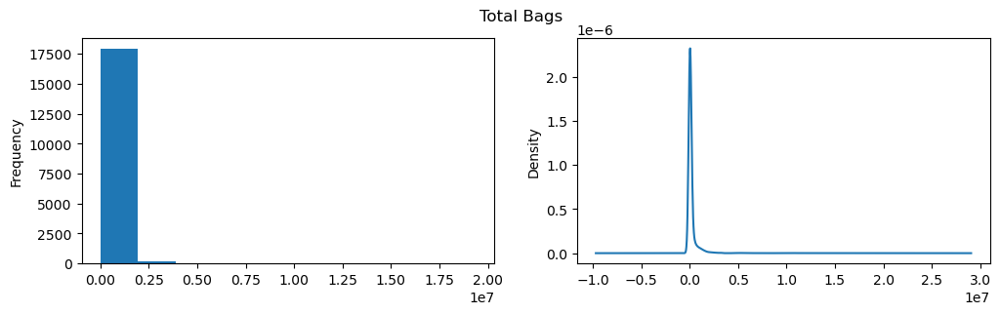

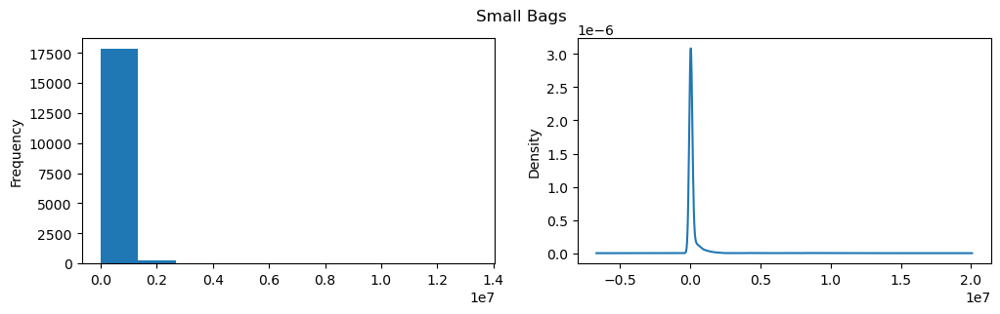

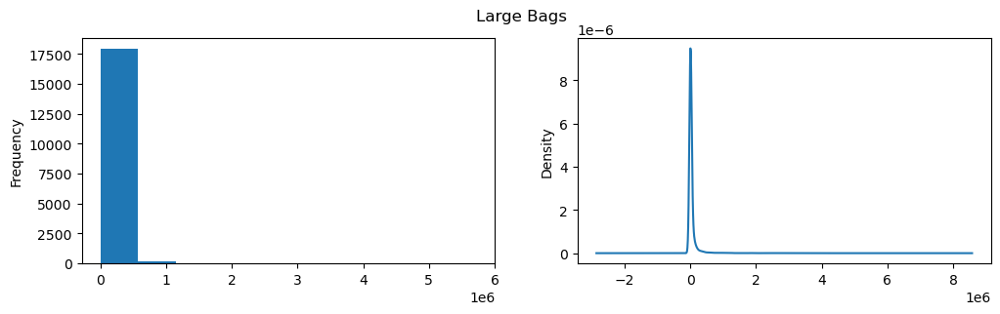

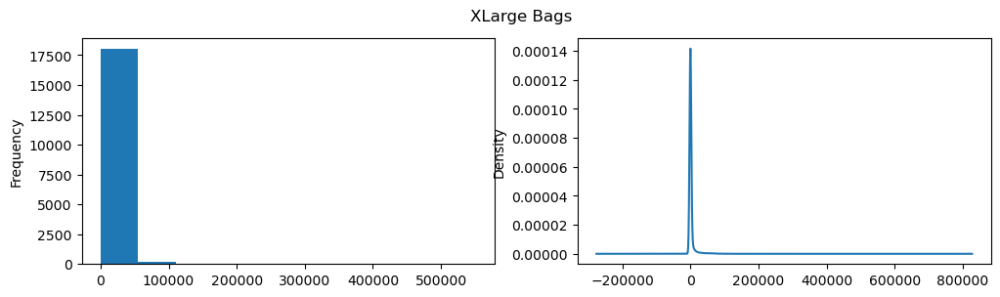

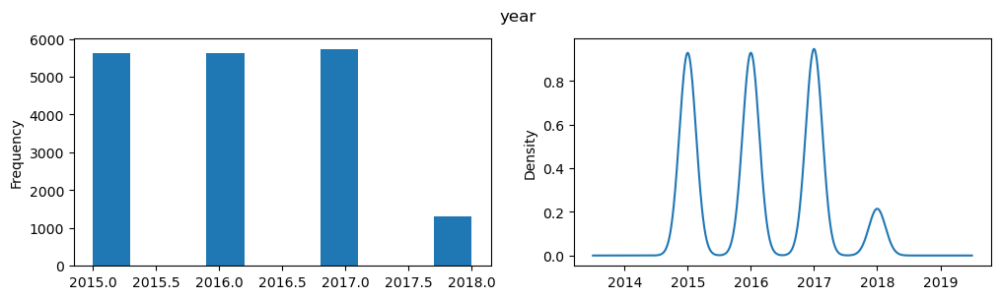

In [210]:
# Comprobar si la distribución de los datos se asemeja a una distribución normal
for num_col in df.select_dtypes(include=np.number).columns:
    fig, ax =plt.subplots(1,2)
    
    df[num_col].hist(figsize=(12, 3), grid=False, ax=ax[0])
    df[num_col].plot.density(figsize=(12, 3), grid=False, ax=ax[1])
    
    ax[0].set_ylabel('Frequency')
    ax[1].set_ylabel('Density')
    fig.suptitle(num_col)
    plt.show()

In [211]:
# Función para obtener el numero de outliers segun z-score
def print_zscore_outliers(df: DataFrame, threshold: float) -> None:
    """
    Print dataset outliers percent
    
    :param df: input DataFrame
    :param threshold: z-score threshold to remove outliers
    
    :return: None
    """
    print('Original rows: ', df.shape[0])
    ### Print dataset outliers percent
    # find absolute value of z-score for each observation
    z = np.abs(stats.zscore(df.select_dtypes(include=np.number)))
    # remove outliers
    df_clean = df[(z < threshold).all(axis=1)]
    # print outliers percent
    print('Outliers percent (all data): ', round((len(df) - len(df_clean)) / len(df) * 100, 2))

    ### Print dataset outliers percent per col
    print('Outliers percent (per col): ')
    for num_col in df.select_dtypes(include=np.number).columns:
        z = np.abs(stats.zscore(df[num_col]))
        df_clean = df[z < threshold]
        print(f"\t{num_col}: , {round((len(df) - len(df_clean)) / len(df) * 100, 2)}")

In [212]:
threshold = 3
print_zscore_outliers(df.select_dtypes(include=np.number), threshold=threshold)

Original rows:  18248
Outliers percent (all data):  3.28
Outliers percent (per col): 
	Unnamed: 0: , 0.0
	AveragePrice: , 0.72
	Total Volume: , 0.94
	4046: , 0.99
	4225: , 0.99
	4770: , 1.42
	Total Bags: , 1.02
	Small Bags: , 0.98
	Large Bags: , 1.38
	XLarge Bags: , 1.28
	year: , 0.0


In [213]:
threshold = 2
print_zscore_outliers(df.select_dtypes(include=np.number), threshold=threshold)

Original rows:  18248
Outliers percent (all data):  8.82
Outliers percent (per col): 
	Unnamed: 0: , 0.0
	AveragePrice: , 3.83
	Total Volume: , 1.05
	4046: , 1.97
	4225: , 1.49
	4770: , 2.0
	Total Bags: , 1.6
	Small Bags: , 1.56
	Large Bags: , 1.95
	XLarge Bags: , 2.04
	year: , 0.0


##### Rango intercuartil (*Inter Quartile Range(IQR)*)
- Método estadístico basado en el cálculo del primer y tercer cuartil (Q1, Q3) del conjunto de datos para poder identificar los rangos Q1-1.5*IQR y Q3+1.5*IQR
- Los outliers son los valores que se encuentran fuera de estos rangos.


<img src="https://almablog-media.s3.ap-south-1.amazonaws.com/image020_1_8ae950b8c7.png" width="800">

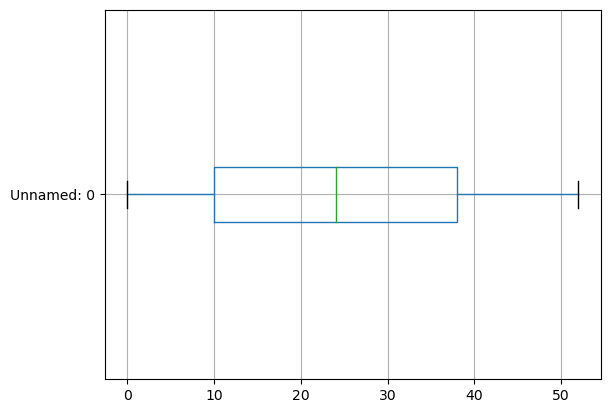

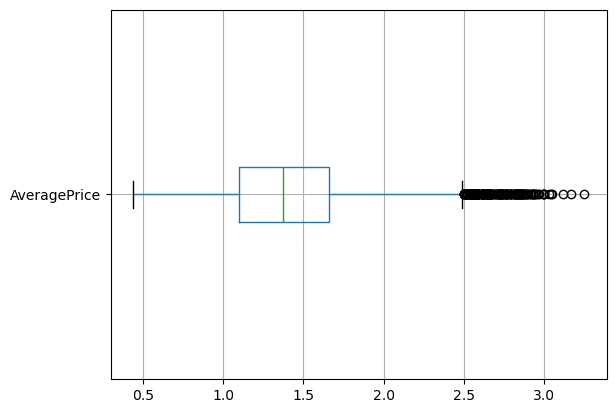

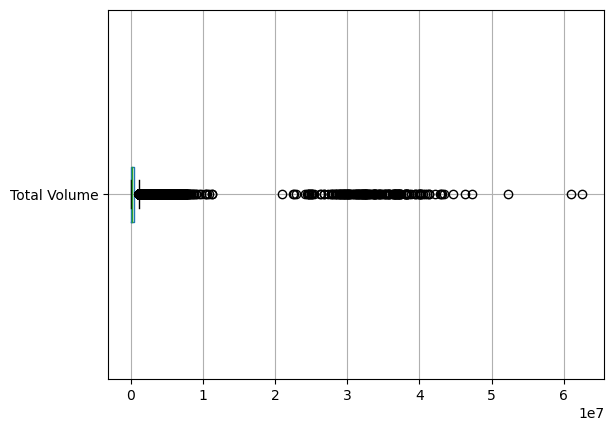

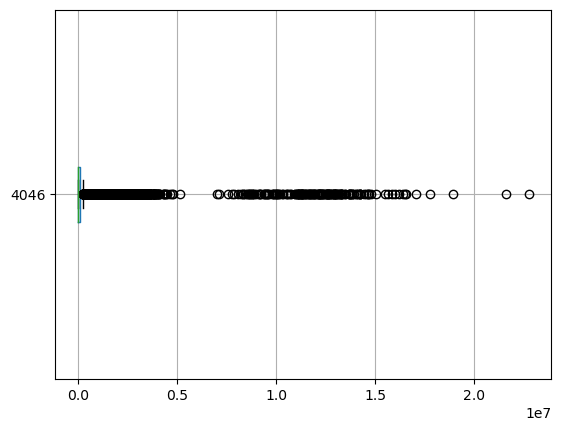

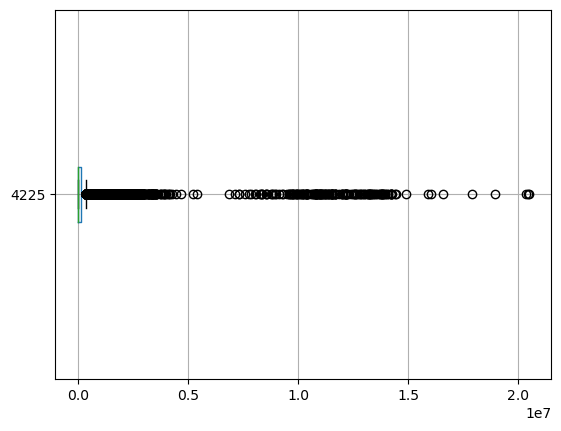

...

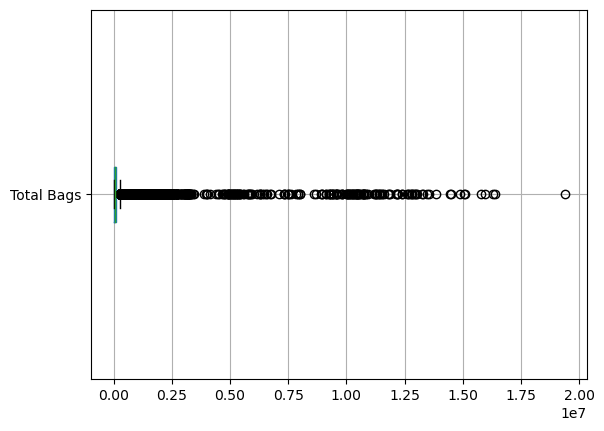

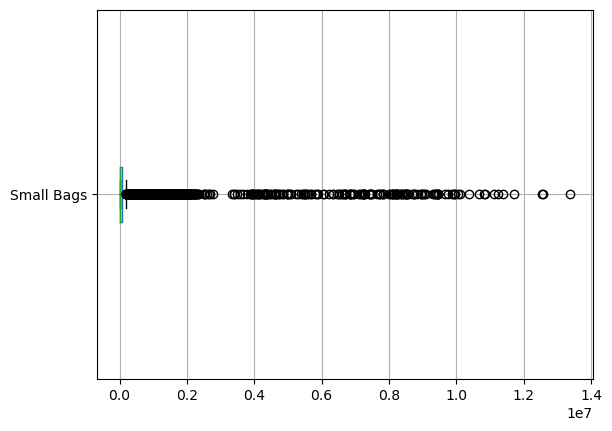

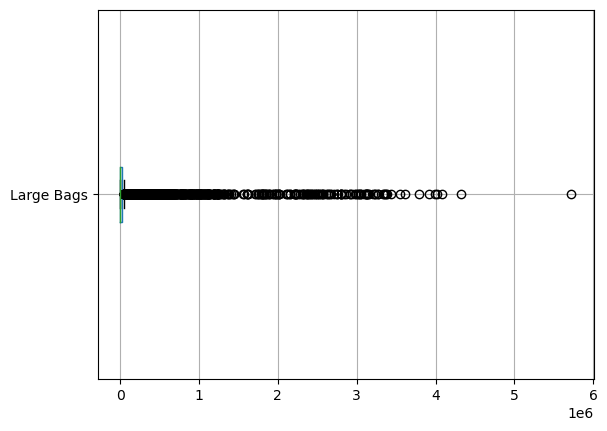

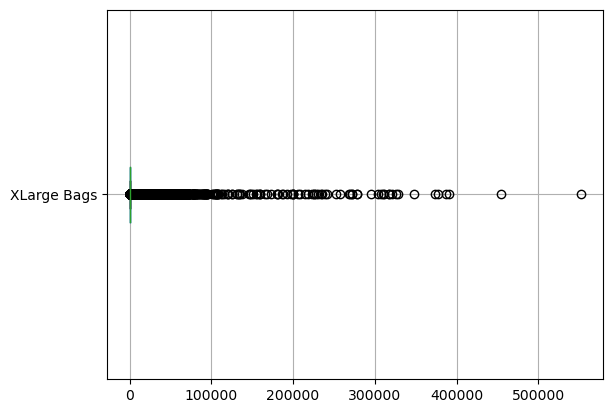

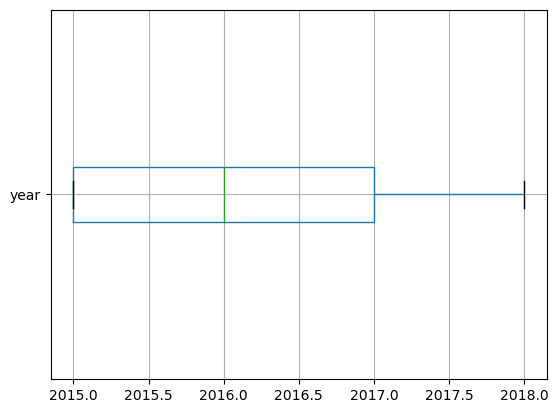

In [214]:
# Visualización de los diagramas de caja o boxplot de las variables
for num_col in df.select_dtypes(include=np.number).columns:
    df.boxplot(column=[num_col], vert=False)
    plt.show()

In [215]:
def print_iqr_outliers(df: DataFrame, threshold: float) -> None:
    """
    Print IQR outliers percent
    
    :param df: input DataFrame
    :param threshold: IQR threshold to remove outliers
    
    :return: None
    """
    print('Original rows: ', df.shape[0])    
    print('Outliers percent (per col): ')
    for num_col in df.select_dtypes(include=np.number).columns:
        # find Q1, Q3, IQR and limits
        Q1 = df[num_col].quantile(0.25)
        Q3 = df[num_col].quantile(0.75)
        IQR = Q3 - Q1
        lower_range = Q1 - 1.5 * IQR
        upper_range = Q3 + 1.5 * IQR
        # remove outliers
        df_clean = df[(df[num_col] > Q1 - threshold * IQR) | (df[num_col] < Q3 + threshold * IQR)]
        print(f"\t{num_col}: , {round((len(df) - len(df_clean)) / len(df) * 100, 2)}")

In [216]:
threshold = 3
print_iqr_outliers(df.select_dtypes(include=np.number), threshold=3)

Original rows:  18248
Outliers percent (per col): 
	Unnamed: 0: , 0.0
	AveragePrice: , 0.0
	Total Volume: , 0.0
	4046: , 0.0
	4225: , 0.0
	4770: , 0.0
	Total Bags: , 0.0
	Small Bags: , 0.0
	Large Bags: , 0.0
	XLarge Bags: , 0.0
	year: , 0.0


In [217]:
threshold = 1
print_iqr_outliers(df.select_dtypes(include=np.number), threshold=1.5)

Original rows:  18248
Outliers percent (per col): 
	Unnamed: 0: , 0.0
	AveragePrice: , 0.0
	Total Volume: , 0.0
	4046: , 0.0
	4225: , 0.0
	4770: , 0.0
	Total Bags: , 0.0
	Small Bags: , 0.0
	Large Bags: , 0.0
	XLarge Bags: , 0.0
	year: , 0.0


#### 3.2.1. Tratamiento de Outliers
- Eliminación:  se desechan las observaciones/entradas de datos/rows que contengan outliers.
- Imputación: los outliers se pueden imputar con valores.
- Transformación: la transformación de columnas/variables/features puede llegar a eliminar la presencia de outliers (cambiar la escala/ rango de los datos)



In [218]:
# Eliminacion
threshold = 2

z = np.abs(stats.zscore(df.select_dtypes(include=np.number)))
df_clean = df[(z < threshold).all(axis=1)]
print('original rows: ', df.shape[0])
print('outliers cleaned rows: ', df_clean.shape[0])

original rows:  18248
outliers cleaned rows:  16639


In [117]:
df_clean.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany
5,5,2015-11-22,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.0,conventional,2015,Albany


In [ ]:
# Imputación
threshold = 3

z = np.abs(stats.zscore(df.select_dtypes(include=np.number)))
for num_col in df.select_dtypes(include=np.number).columns:
    z = np.abs(stats.zscore(df[num_col]))
    outliers = df[z > threshold]
    df[outliers] = np.nan
    df[num_col].fillna(df[num_col].median(), inplace=True)

In [ ]:
# Transformación: Log Transform
for num_col in df.select_dtypes(include=np.number).columns:
    fig, ax =plt.subplots(1,2)
    
    df[num_col].plot.density(figsize=(12, 3), grid=False, ax=ax[0])
    np.log(df[num_col]).plot.density(figsize=(12, 3), grid=False, ax=ax[1])
    
    ax[0].title.set_text('Original')
    ax[1].title.set_text('Log Transform')
    ax[0].set_ylabel('Density')
    fig.suptitle(num_col)
    plt.show()


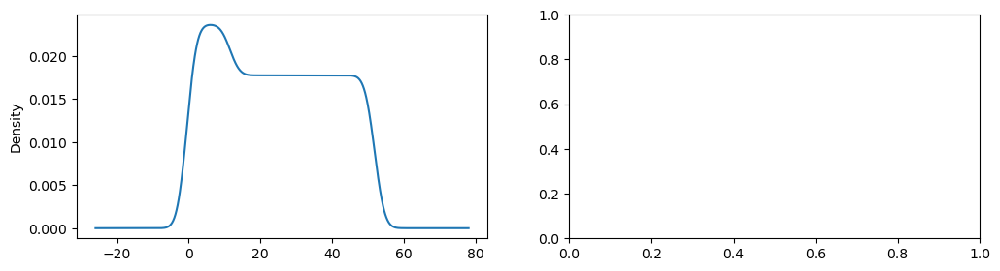

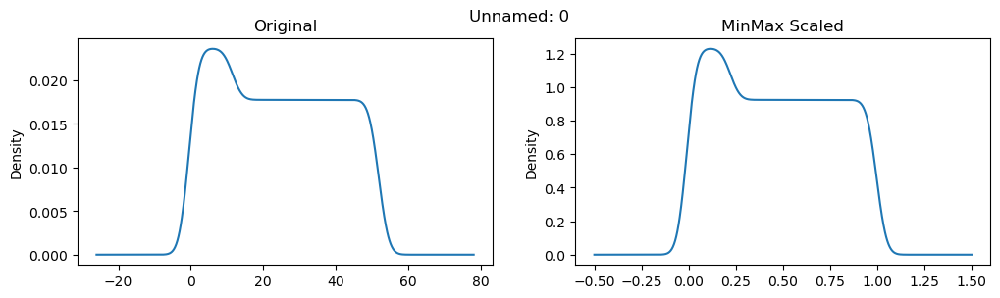

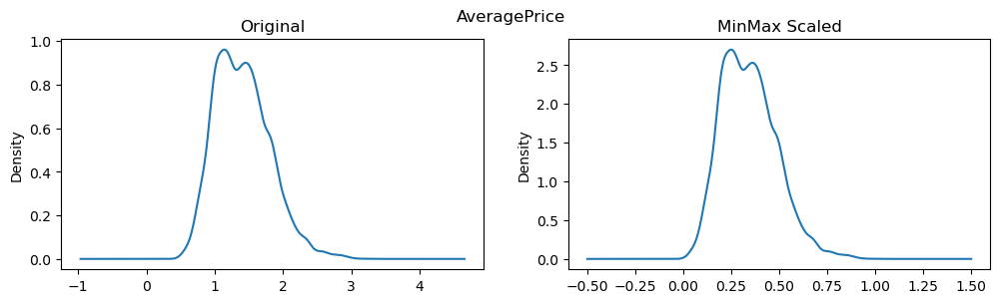

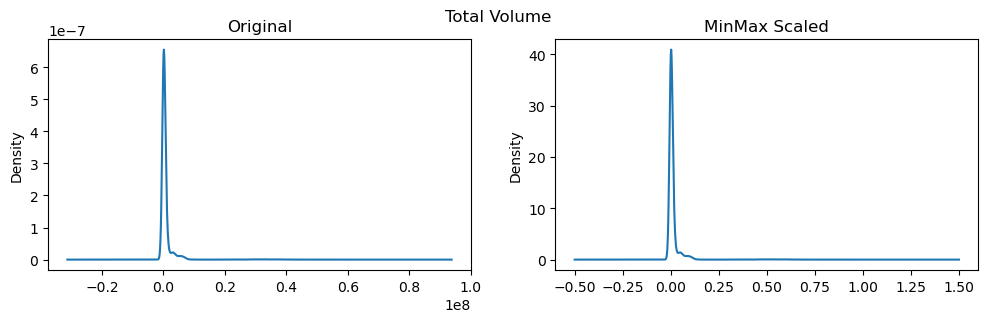

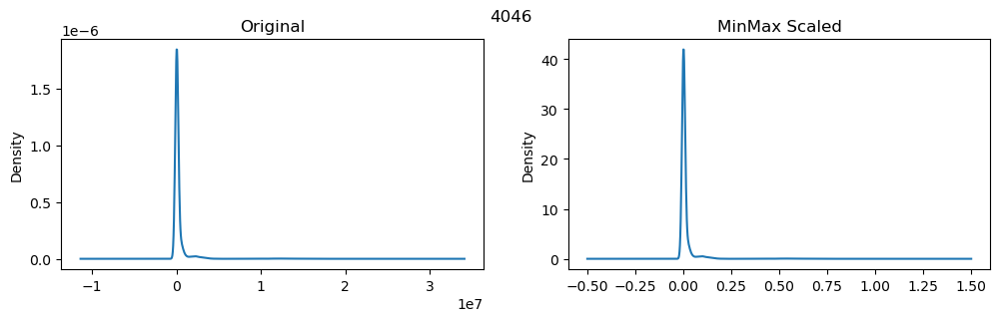

...

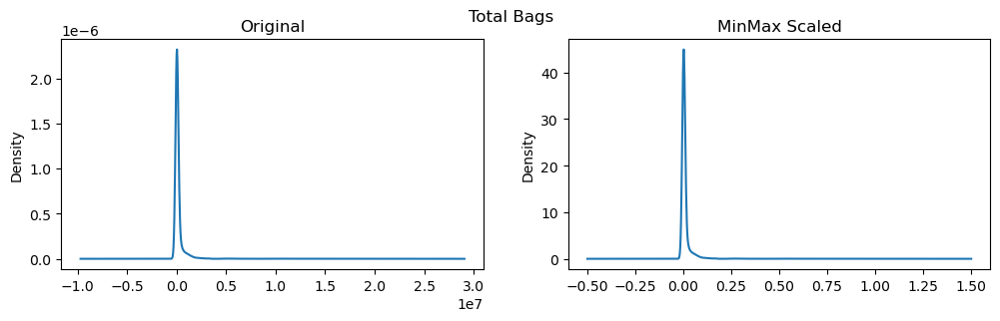

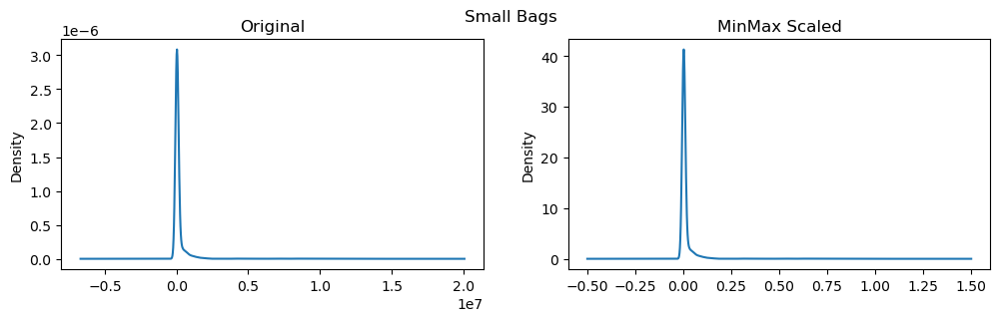

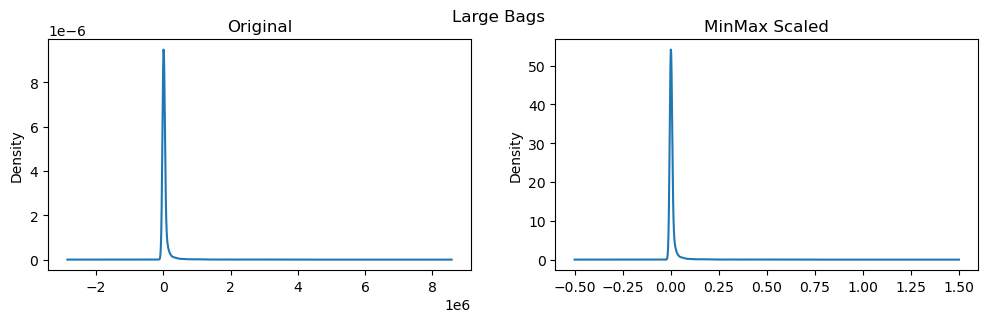

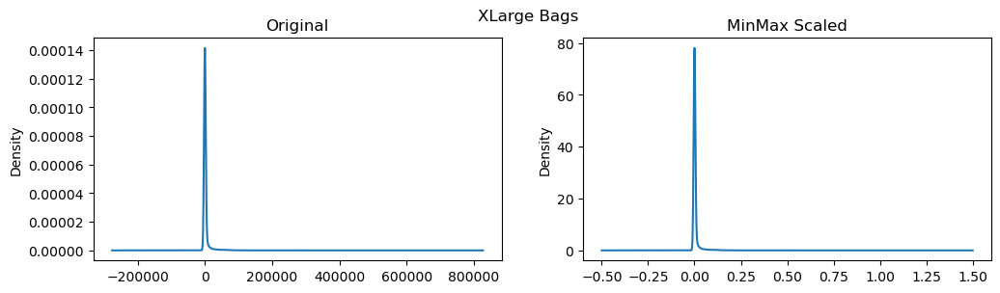

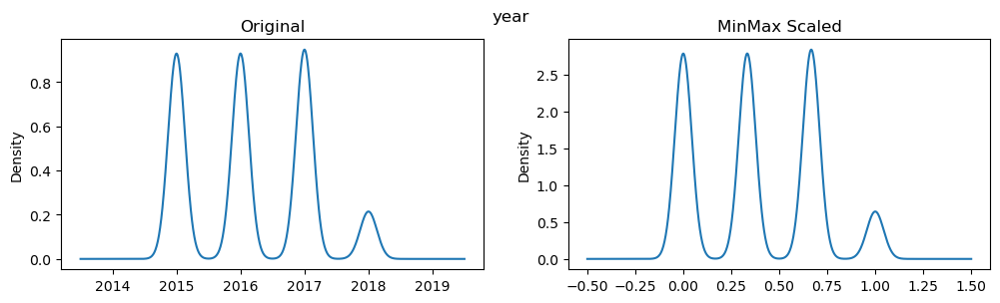

In [221]:
# Transformación: MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_scaled = df.copy()
df_scaled[df_scaled.select_dtypes(include=np.number).columns] = scaler.fit_transform(df_scaled.select_dtypes(include=np.number))

for num_col in df.select_dtypes(include=np.number).columns:
    fig, ax =plt.subplots(1,2)
    
    df[num_col].plot.density(figsize=(12, 3), grid=False, ax=ax[0])
    df_scaled[num_col].plot.density(figsize=(12, 3), grid=False, ax=ax[1])
    
    ax[0].title.set_text('Original')
    ax[1].title.set_text('MinMax Scaled')
    ax[0].set_ylabel('Density')
    fig.suptitle(num_col)
    plt.show()


### 3.3. Valores duplicados

- Valores o entradas de datos repetidas dentro del dataset.
- Suelen desecharse: no suelen aportan valor en el entrenamiento de un modelo.
- Su eliminación puede realizarse por observación/fila o columna/feature.
  - .duplicated()
  - .drop_duplicates()

In [222]:
df.duplicated().sum()

0

In [ ]:
df.drop_duplicates(keep='first', inplace=True)
help(pd.DataFrame.drop_duplicates)

### 3.4. Valores incorrectos

- Valores incorrectos, ya sea por error humano o no, intencional o no.
- La única manera de detectarlos es a través de la observación y el conocimiento de los datos y su contexto.
- Es recomendable realizar análisis de distribución, de frecuencias, etc. para poder llegar a detectarlos.

NO APLICA EN ESTE DF


In [ ]:
df.sex.unique()

In [ ]:
df.shape

In [ ]:
df = df[df['sex'].isin(['MALE', 'FEMALE'])]
# df = df[df['sex'] != ('.')]
# df = df[~df['sex'].isin(['.', ';', ',', '!', None])]

In [ ]:
df.shape

In [ ]:
df.sex.unique()

## 4. Transformacion de los datos (Data Transformation)
- Para mejorar su entendimiento.
- Para mejorar su rendimiento en el entrenamiento de un modelo de ML.
- Para adecuar su uso al proporcionarlos a un modelo de ML.

### 4.1. Escalado de datos (Scaling)

- Transformación de valores a un rango o escala concreta.
- Se utiliza  cuando los diferentes campos/columnas/features pueden poseer diferentes escalas 
- Ayuda a comparar diferentes campos al convertirlos a un mismo o similar rango de valores -> Ayuda en el entrenamiento del algoritmo de ML


In [124]:
df_num = df.select_dtypes(include=np.number)

#### Normalizacion
- Transforma los datos a una escala entre el menor y el mayor valor dados.
- Queremos cambiar el rango de los datos y que posean una distribución normal.

In [125]:
df_num_norm = (df_num-df_num.mean())/(df_num.max()-df_num.min())

In [126]:
df_num_norm.head()

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
1,-0.446799,-0.019923,-0.012732,-0.012854,-0.012238,-0.008947,-0.011880,-0.012910,-0.009485,-0.005631,-0.382654
2,-0.427568,-0.169389,-0.011718,-0.012849,-0.009087,-0.008919,-0.011950,-0.013012,-0.009484,-0.005631,-0.382654
3,-0.408338,-0.116008,-0.012346,-0.012834,-0.010903,-0.008941,-0.012070,-0.013189,-0.009478,-0.005631,-0.382654
4,-0.389107,-0.044834,-0.012793,-0.012842,-0.012278,-0.008940,-0.012051,-0.013166,-0.009467,-0.005631,-0.382654
5,-0.369876,-0.051951,-0.012714,-0.012832,-0.012071,-0.008953,-0.012025,-0.013123,-0.009479,-0.005631,-0.382654


In [127]:
df_num.head()

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
1,1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,2015
2,2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,2015
3,3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,2015
4,4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,2015
5,5,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.0,2015


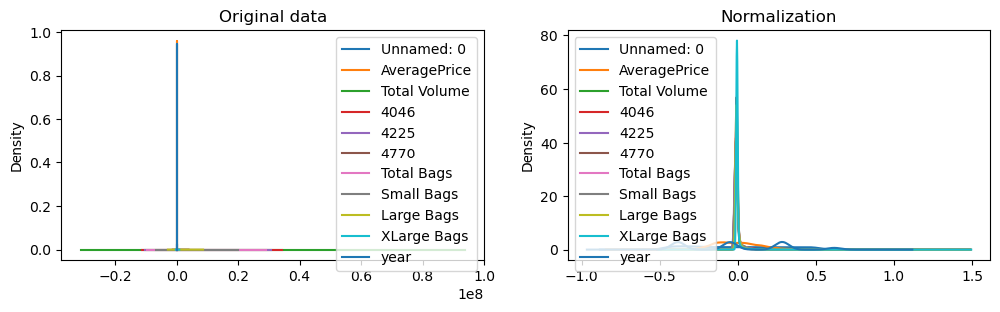

In [128]:
fig, ax =plt.subplots(1,2)

df_num.plot.density(figsize=(12, 3), grid=False, ax=ax[0])
df_num_norm.plot.density(figsize=(12, 3), grid=False, ax=ax[1])

ax[0].title.set_text('Original data')
ax[1].title.set_text('Normalization')

plt.show()

In [129]:
df.select_dtypes(include='O').join(df_num_norm, how='left').head()

,Date,type,region,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
1,2015-12-20,conventional,Albany,-0.446799,-0.019923,-0.012732,-0.012854,-0.012238,-0.008947,-0.011880,-0.012910,-0.009485,-0.005631,-0.382654
2,2015-12-13,conventional,Albany,-0.427568,-0.169389,-0.011718,-0.012849,-0.009087,-0.008919,-0.011950,-0.013012,-0.009484,-0.005631,-0.382654
3,2015-12-06,conventional,Albany,-0.408338,-0.116008,-0.012346,-0.012834,-0.010903,-0.008941,-0.012070,-0.013189,-0.009478,-0.005631,-0.382654
4,2015-11-29,conventional,Albany,-0.389107,-0.044834,-0.012793,-0.012842,-0.012278,-0.008940,-0.012051,-0.013166,-0.009467,-0.005631,-0.382654
5,2015-11-22,conventional,Albany,-0.369876,-0.051951,-0.012714,-0.012832,-0.012071,-0.008953,-0.012025,-0.013123,-0.009479,-0.005631,-0.382654


#### Escalado Mínimo-Máximo (Min-Max Scaling)
- Substrae a cada valor el valor mínimo del conjunto de datos y lo divide por el rango de dicho conjunto.
- Queremos cambiar el rango de los datos sin cambiar la forma de su distribución.
  - MinMaxScaler()


In [132]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_num_minmax = pd.DataFrame(scaler.fit_transform(df_num), columns=df_num.columns)

In [133]:
df_num_minmax.head()

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
0,0.019231,0.323843,0.000877,0.000030,0.002181,0.000023,0.000491,0.000703,0.000017,0.0,0.0
1,0.038462,0.174377,0.001890,0.000035,0.005332,0.000051,0.000420,0.000601,0.000018,0.0,0.0
2,0.057692,0.227758,0.001262,0.000050,0.003516,0.000029,0.000300,0.000424,0.000023,0.0,0.0
3,0.076923,0.298932,0.000815,0.000041,0.002142,0.000030,0.000319,0.000447,0.000035,0.0,0.0
4,0.096154,0.291815,0.000894,0.000052,0.002348,0.000017,0.000345,0.000490,0.000022,0.0,0.0


In [134]:
df_num.head()

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
1,1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,2015
2,2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,2015
3,3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,2015
4,4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,2015
5,5,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.0,2015


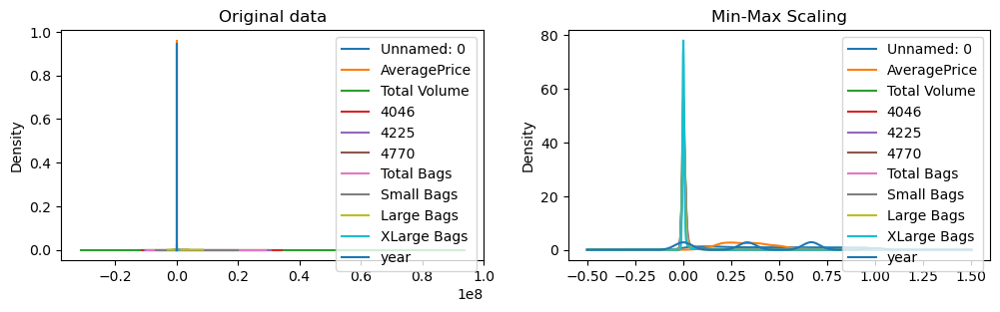

In [135]:
fig, ax =plt.subplots(1,2)

df_num.plot.density(figsize=(12, 3), grid=False, ax=ax[0])
df_num_minmax.plot.density(figsize=(12, 3), grid=False, ax=ax[1])

ax[0].title.set_text('Original data')
ax[1].title.set_text('Min-Max Scaling')

plt.show()

In [136]:
df.select_dtypes(include='O').join(df_num_norm, how='left').head()

,Date,type,region,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
1,2015-12-20,conventional,Albany,-0.446799,-0.019923,-0.012732,-0.012854,-0.012238,-0.008947,-0.011880,-0.012910,-0.009485,-0.005631,-0.382654
2,2015-12-13,conventional,Albany,-0.427568,-0.169389,-0.011718,-0.012849,-0.009087,-0.008919,-0.011950,-0.013012,-0.009484,-0.005631,-0.382654
3,2015-12-06,conventional,Albany,-0.408338,-0.116008,-0.012346,-0.012834,-0.010903,-0.008941,-0.012070,-0.013189,-0.009478,-0.005631,-0.382654
4,2015-11-29,conventional,Albany,-0.389107,-0.044834,-0.012793,-0.012842,-0.012278,-0.008940,-0.012051,-0.013166,-0.009467,-0.005631,-0.382654
5,2015-11-22,conventional,Albany,-0.369876,-0.051951,-0.012714,-0.012832,-0.012071,-0.008953,-0.012025,-0.013123,-0.009479,-0.005631,-0.382654


#### Estandarización (Standardization)
- Transforma los datos extrayendo la media y dividiendo por la desviación estándar.
- Queremos asegurarnos de que la media es cero y la desviación estándar es uno, ayudando al modelo en el entrenamiento.
  - StandardScaler()

In [137]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_num_std = pd.DataFrame(scaler.fit_transform(df_num), columns=df_num.columns)

In [138]:
df_num_std.head()

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
0,-1.500875,-0.139026,-0.230433,-0.231109,-0.208060,-0.212003,-0.233357,-0.231575,-0.222341,-0.175585,-1.221365
1,-1.436276,-1.182048,-0.212092,-0.231014,-0.154485,-0.211331,-0.234736,-0.233406,-0.222318,-0.175585,-1.221365
2,-1.371677,-0.809540,-0.223450,-0.230747,-0.185357,-0.211870,-0.237103,-0.236575,-0.222192,-0.175585,-1.221365
3,-1.307077,-0.312863,-0.231544,-0.230898,-0.208725,-0.211840,-0.236725,-0.236161,-0.221930,-0.175585,-1.221365
4,-1.242478,-0.362531,-0.230114,-0.230706,-0.205212,-0.212140,-0.236218,-0.235397,-0.222218,-0.175585,-1.221365


In [139]:
df_num.head()

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
1,1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,2015
2,2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,2015
3,3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,2015
4,4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,2015
5,5,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.0,2015


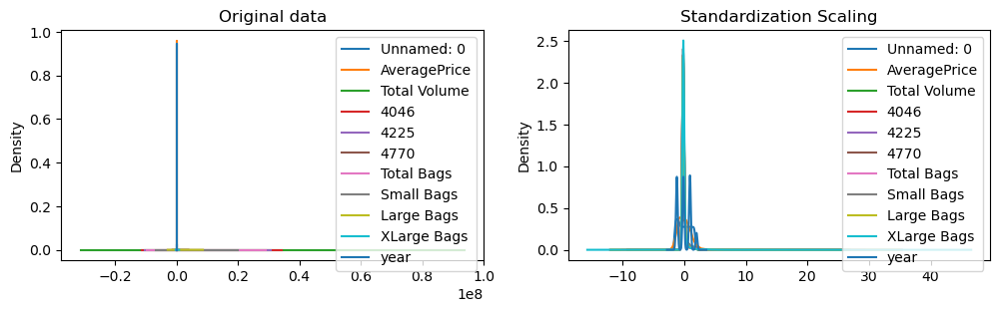

In [140]:
fig, ax =plt.subplots(1,2)

df_num.plot.density(figsize=(12, 3), grid=False, ax=ax[0])
df_num_std.plot.density(figsize=(12, 3), grid=False, ax=ax[1])

ax[0].title.set_text('Original data')
ax[1].title.set_text('Standardization Scaling')

plt.show()

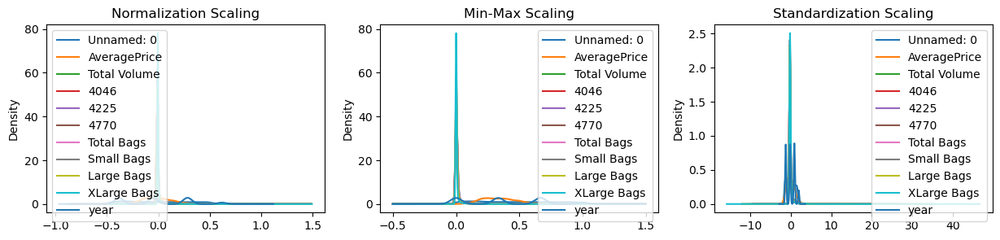

In [141]:
fig, ax =plt.subplots(1,3)

df_num_norm.plot.density(figsize=(15, 3), grid=False, ax=ax[0])
df_num_minmax.plot.density(figsize=(15, 3), grid=False, ax=ax[1])
df_num_std.plot.density(figsize=(15, 3), grid=False, ax=ax[2])

ax[0].title.set_text('Normalization Scaling')
ax[1].title.set_text('Min-Max Scaling')
ax[2].title.set_text('Standardization Scaling')

plt.show()

In [223]:
df.select_dtypes(include='O').join(df_num_minmax).head()

,Date,type,region,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
1,2015-12-20,conventional,Albany,0.038462,0.174377,0.001890,0.000035,0.005332,0.000051,0.000420,0.000601,0.000018,0.0,0.0
2,2015-12-13,conventional,Albany,0.057692,0.227758,0.001262,0.000050,0.003516,0.000029,0.000300,0.000424,0.000023,0.0,0.0
3,2015-12-06,conventional,Albany,0.076923,0.298932,0.000815,0.000041,0.002142,0.000030,0.000319,0.000447,0.000035,0.0,0.0
4,2015-11-29,conventional,Albany,0.096154,0.291815,0.000894,0.000052,0.002348,0.000017,0.000345,0.000490,0.000022,0.0,0.0
5,2015-11-22,conventional,Albany,0.115385,0.195730,0.001334,0.000060,0.003599,0.000037,0.000429,0.000612,0.000021,0.0,0.0


### 4.2. Codificación (Encoding)
- Transformación de valores categóricos en valores numéricos.
- Suele ser necesaria ya que los diferentes algoritmos de machine learning, por norma general, solo aceptan la ingesta de datos numéricos.

In [224]:
df_cat = df.select_dtypes(include='O')

In [225]:
df_cat.head()

,Date,type,region
1,2015-12-20,conventional,Albany
2,2015-12-13,conventional,Albany
3,2015-12-06,conventional,Albany
4,2015-11-29,conventional,Albany
5,2015-11-22,conventional,Albany


#### Label/Ordinal Encoding
- Codificación de categorías con valores enteros siguiendo un orden: 0, 1, 2, etc.
  - LabelEncoder()

In [147]:
# specify the order of the categories
ordinal_type_map = {'conventional': 0, 'organic': 1}

# perform ordinal encoding on the 'quality' column
df_cat['type'].map(ordinal_type_map).value_counts()

type
0    9125
1    9123
Name: count, dtype: int64

In [150]:
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
le = LabelEncoder()

# Fit and transform the categorical data
df_cat_le = df_cat.apply(LabelEncoder().fit_transform)
df_cat_le.head()

,Date,type,region
1,50,0,0
2,49,0,0
3,48,0,0
4,47,0,0
5,46,0,0


In [151]:
for col in df_cat.columns:
    print(col, ':', list(set(df[col])),'-->' , list(set((df_cat_le[col]))))

Date : ['2016-09-18', '2017-11-12', '2017-10-01', '2017-12-17', '2015-02-08', '2017-12-31', '2015-09-20', '2017-01-22', '2015-04-26', '2017-04-09', '2017-03-05', '2017-10-29', '2017-01-29', '2015-08-23', '2017-04-16', '2016-11-27', '2016-05-15', '2017-08-20', '2016-11-20', '2015-08-02', '2015-12-20', '2016-01-31', '2016-06-26', '2017-04-02', '2017-02-26', '2017-05-28', '2018-03-04', '2016-02-21', '2015-11-22', '2017-05-21', '2017-07-02', '2018-03-18', '2015-03-22', '2015-07-19', '2017-08-13', '2015-03-08', '2016-04-24', '2017-12-24', '2018-02-11', '2017-11-26', '2017-05-14', '2015-06-07', '2017-04-30', '2015-05-10', '2017-09-03', '2017-06-04', '2016-08-14', '2017-09-10', '2016-03-20', '2018-01-07', '2016-07-31', '2015-10-25', '2016-09-04', '2017-09-24', '2017-10-22', '2018-02-25', '2015-12-27', '2018-01-14', '2016-10-02', '2017-06-18', '2015-04-19', '2017-01-08', '2017-06-11', '2016-08-28', '2017-02-19', '2016-05-22', '2016-10-09', '2016-05-29', '2017-12-03', '2016-02-28', '2016-07-17'

#### One-Hot/Dummy Encoding
- Codificación de cada valor único con la creación de una nueva variable.
- cada nueva variable es mapeada con valores binarios de 0 o 1 indicando la ausencia (0) o presencia (1) de dicho valor.
- Se suele utilizar cuando las variables o features son nominales (no tienen un orden concreto).
- El **Dummy encoding** es similar al one-hot encoding: para el caso de one-hot, N categorías/valores únicos crean N variables binarias nuevas; en el caso del dummy encoding, crea N-1 variables nuevas
    - .get_dummies()
    - .get_dummies(drop_first=True)

In [152]:
# One-hot encoding
pd.get_dummies(df_cat['region']).head()

,Albany,Atlanta,BaltimoreWashington,Boise,Boston,BuffaloRochester,California,Charlotte,Chicago,CincinnatiDayton,...,SouthCarolina,SouthCentral,Southeast,Spokane,StLouis,Syracuse,Tampa,TotalUS,West,WestTexNewMexico
1,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [153]:
df_cat_onehot = pd.get_dummies(df_cat).astype(int)

df_cat_onehot.head()

,Date_2015-01-04,Date_2015-01-11,Date_2015-01-18,Date_2015-01-25,Date_2015-02-01,Date_2015-02-08,Date_2015-02-15,Date_2015-02-22,Date_2015-03-01,Date_2015-03-08,...,region_SouthCarolina,region_SouthCentral,region_Southeast,region_Spokane,region_StLouis,region_Syracuse,region_Tampa,region_TotalUS,region_West,region_WestTexNewMexico
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [154]:
# Dummy encoding
pd.get_dummies(df_cat['region'], drop_first=True, prefix='region').head()

,region_Atlanta,region_BaltimoreWashington,region_Boise,region_Boston,region_BuffaloRochester,region_California,region_Charlotte,region_Chicago,region_CincinnatiDayton,region_Columbus,...,region_SouthCarolina,region_SouthCentral,region_Southeast,region_Spokane,region_StLouis,region_Syracuse,region_Tampa,region_TotalUS,region_West,region_WestTexNewMexico
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [155]:
df_cat_dummy = pd.get_dummies(df_cat, drop_first=True).astype(int)

df_cat_dummy.head()

,Date_2015-01-11,Date_2015-01-18,Date_2015-01-25,Date_2015-02-01,Date_2015-02-08,Date_2015-02-15,Date_2015-02-22,Date_2015-03-01,Date_2015-03-08,Date_2015-03-15,...,region_SouthCarolina,region_SouthCentral,region_Southeast,region_Spokane,region_StLouis,region_Syracuse,region_Tampa,region_TotalUS,region_West,region_WestTexNewMexico
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [156]:
pd.get_dummies(df_cat['region']).sample(n=4, random_state=1).astype(int)

,Albany,Atlanta,BaltimoreWashington,Boise,Boston,BuffaloRochester,California,Charlotte,Chicago,CincinnatiDayton,...,SouthCarolina,SouthCentral,Southeast,Spokane,StLouis,Syracuse,Tampa,TotalUS,West,WestTexNewMexico
4934,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8080,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8882,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2070,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [157]:
pd.get_dummies(df_cat['region'], drop_first=True).sample(n=4, random_state=1).astype(int)

,Atlanta,BaltimoreWashington,Boise,Boston,BuffaloRochester,California,Charlotte,Chicago,CincinnatiDayton,Columbus,...,SouthCarolina,SouthCentral,Southeast,Spokane,StLouis,Syracuse,Tampa,TotalUS,West,WestTexNewMexico
4934,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8080,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8882,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2070,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### Binary Encoding
- Codifica los valores con valores binarios únicos sin crear nuevas variables.


In [158]:
df_cat_binary = df_cat.copy()

# specify the order of the categories
binary_types_map = {'conventional': 0, 'organic': 1}

# perform binary encoding on the 'species' column
df_cat_binary['type'] = df_cat_binary['type'].map(binary_types_map).apply(lambda x: format(x, 'b'))

df_cat_binary['type'].unique()

array(['0', '1'], dtype=object)

In [159]:
for col in df_cat_binary.columns:
    le = LabelEncoder()
    ids = le.fit_transform(df_cat_binary[col])
    mapping = dict(zip(le.classes_, range(len(le.classes_))))
    df_cat_binary[col] = df_cat_binary[col].map(mapping).astype(int).apply(lambda x: format(x, 'b'))

In [160]:
for col in df_cat_binary.columns:
    print(col, ':', list(set(df_cat[col])),'-->' , list(set((df_cat_binary[col]))))

Date : ['2016-09-18', '2017-11-12', '2017-10-01', '2017-12-17', '2015-02-08', '2017-12-31', '2015-09-20', '2017-01-22', '2015-04-26', '2017-04-09', '2017-03-05', '2017-10-29', '2017-01-29', '2015-08-23', '2017-04-16', '2016-11-27', '2016-05-15', '2017-08-20', '2016-11-20', '2015-08-02', '2015-12-20', '2016-01-31', '2016-06-26', '2017-04-02', '2017-02-26', '2017-05-28', '2018-03-04', '2016-02-21', '2015-11-22', '2017-05-21', '2017-07-02', '2018-03-18', '2015-03-22', '2015-07-19', '2017-08-13', '2015-03-08', '2016-04-24', '2017-12-24', '2018-02-11', '2017-11-26', '2017-05-14', '2015-06-07', '2017-04-30', '2015-05-10', '2017-09-03', '2017-06-04', '2016-08-14', '2017-09-10', '2016-03-20', '2018-01-07', '2016-07-31', '2015-10-25', '2016-09-04', '2017-09-24', '2017-10-22', '2018-02-25', '2015-12-27', '2018-01-14', '2016-10-02', '2017-06-18', '2015-04-19', '2017-01-08', '2017-06-11', '2016-08-28', '2017-02-19', '2016-05-22', '2016-10-09', '2016-05-29', '2017-12-03', '2016-02-28', '2016-07-17'

#### Frequency/Count Encoding
- Codificación basada en el conteo o frecuencia de cada categoría.
- Induce involuntariamente un sesgo de orden.

In [164]:
df_cat_freq = df_cat.copy()

# perform count encoding on the 'fruit' column
df_cat_freq['type'] = df_cat_freq['type'].map(df_cat_freq['type'].value_counts())

print('type: ', df_cat_freq['type'].unique())


type:  [9125 9123]


#### Target Encoding
- Codificación basada en el cálculo del valor promedio de la frecuencia del target/label/clase  para cada categoría.
- El dataset mantiene el mismo tamaño inicial.
- Puede llegar a producir un sobreajuste o overfitting si el dataset no se ha particionado previamente en train-test/train-eval-test

In [173]:
df_cat_target = df_cat.copy()

le = LabelEncoder()
df_cat_target['target'] = le.fit_transform(df_cat_target['region'])

target_mean = df_cat_target.groupby('type')['target'].mean()

In [174]:
target_mean

type
conventional    26.502904
organic         26.491286
Name: target, dtype: float64

In [175]:
df_cat.columns

Index(['Date', 'type', 'region'], dtype='object')

In [176]:
# Replace the categorical data with the mean target value
for col in df_cat.columns:
    target_mean = df_cat_target.groupby(col)['target'].mean()
    df_cat_target[col] = df_cat_target[col].map(target_mean)
    
df_cat_target.head()

,Date,type,region,target
1,26.500000,26.502904,0.0,0
2,26.500000,26.502904,0.0,0
3,26.252336,26.502904,0.0,0
4,26.500000,26.502904,0.0,0
5,26.500000,26.502904,0.0,0


#### Solucion aplicada: label encoding

In [226]:
le = LabelEncoder()
df = df_cat.apply(LabelEncoder().fit_transform).join(df.select_dtypes(include=np.number), how='left')

In [178]:
df.head()

,Date,type,region,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
1,50,0,0,1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,2015
2,49,0,0,2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,2015
3,48,0,0,3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,2015
4,47,0,0,4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,2015
5,46,0,0,5,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.0,2015


### 4.3. Discretización (Discretization)
- La discretización o discretization consiste en la conversión o transformación de variables/features continuas (temperatura, tiempo, peso, etc.) en discretas. 
- Facilita el entendimiento de la variable y la detección de outliers.
- El objetivo es mejorar el rendimiento del algoritmo de ML en el aprendizaje.

#### Uniforme (Uniform discretization or Equal-width)
- Consiste en dividir el rango de la variable continua entre n intervalos de igual tamaño o bins.
- La ventaja y desventaja al mismo tiempo de este tipo de discretización es que no afecta significativamente a la distribución de la variable.
    - pandas.cut()

In [227]:
df['Date_bins'] =  pd.cut(df['Date'].values, bins=3, labels=[0, 1, 2])

In [228]:
print('short: ', 'max-min diff: ', df[df['Date_bins'] ==  0]['Date'].max() - df[df['Date_bins'] ==  0]['Date'].min())
print('medium: ', 'max-min diff: ', df[df['Date_bins'] ==  1]['Date'].max() - df[df['Date_bins'] ==  1]['Date'].min())
print('long: ', 'max-min diff: ', df[df['Date_bins'] ==  2]['Date'].max() - df[df['Date_bins'] ==  2]['Date'].min())

short:  max-min diff:  56
medium:  max-min diff:  55
long:  max-min diff:  55


In [229]:
df['Date_bins'].value_counts()

Date_bins
0    6154
1    6048
2    6046
Name: count, dtype: int64

In [230]:
df[['Date', 'Date_bins']]

,Date,Date_bins
1,50,0
2,49,0
3,48,0
4,47,0
5,46,0
...,...,...
18244,161,2
18245,160,2
18246,159,2
18247,158,2


#### Quantile discretization
- Consiste en ordenar los valores continuos de la variable en intervalos con el mismo número de observaciones o frecuencia.
- Aunque el tamaño de los bins no sea el mismo para todos los bins, cada bin posee el mismo número de valores.
- Es útil para la detección de datos extremos o outliers.
  - pandas.qcut()

In [232]:
df['Date_bins'] =  pd.qcut(df['Date'], q=4)

In [233]:
df['Date_bins'].value_counts()

Date_bins
(-0.001, 42.0]    4644
(84.0, 126.0]     4536
(42.0, 84.0]      4534
(126.0, 168.0]    4534
Name: count, dtype: int64

In [234]:
df['Date_bins'] =  pd.qcut(df['Date'], q=4, labels=[0, 1, 2, 3])

In [235]:
df['Date_bins'].value_counts()

Date_bins
0    4644
2    4536
1    4534
3    4534
Name: count, dtype: int64

#### Discretización avanzada con uso de algoritmos de ML
- Existen otros tipos de discretización más avanzados que requieren el uso de algoritmos de ML:
  - Clustering con K-means
  - Árboles de decisión
  - etc.
  
[link con ejemplo practico](https://machinelearningmastery.com/discretization-transforms-for-machine-learning/)

#### Aplicacion final

In [237]:
df['Date_bins'] =  pd.cut(df['Date'].values, bins=3, labels=[0, 1, 2]).astype(int)

### 4.4. Reducción dimensional (Dimensionality reduction)
- La reducción de dimensiones o dimensionality reduction consiste en limitar el número de variables o features en un dataset para preservar únicamente la información relevante.
- Esta reducción puede ser lineal o no lineal, dependiendo del método usado.

In [238]:
df.dtypes

Date              int64
type              int64
region            int64
Unnamed: 0        int64
AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
year              int64
Date_bins         int64
dtype: object

#### Selección de variables (Feature selection)

##### Métodos de filtrado (Filter Methods)
- Selecciona un subset de features basado en su relación estadística con el target/etiqueta/label
  - Chi-cuadrado: :prueba estadística para evaluar la probabilidad de correlación utilizando su distribución de frecuencia.
  - ANOVA: análisis de la varianza: prueba estadística de si las medias de varios grupos son iguales o no.
  - Pearson: mide la relación estadística entre dos variables continuas lineales.
  - etc.

##### Chi-cuadrado, ANOVA
- sklearn.feature_selection: SelectKBest, chi2, f_classif

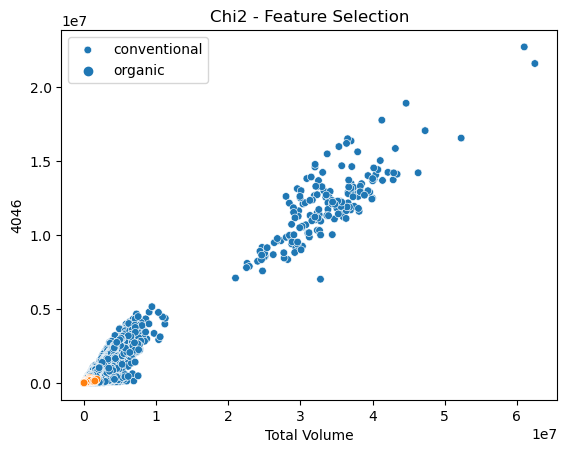

''

In [247]:
from sklearn.feature_selection import (
    SelectKBest,
    chi2,
    f_classif) # ANOVA

X =df.drop('type', axis=1)
y = df.type

fs = SelectKBest(score_func=chi2, k=2)
fs.fit(X, y)

X_train_fs = pd.DataFrame(fs.transform(X), columns = X.columns[fs.get_support()])
X_y_fs = X_train_fs.join(y, how='right')

# Representación 2D
target_names = df.type
colors = ["navy", "red"]
lw = 2

sns.scatterplot(data=X_y_fs, x=X_y_fs.columns[0], y=X_y_fs.columns[1], hue="type", s=30)
    
plt.legend(type, loc="best", shadow=False, scatterpoints=1)
plt.title("Chi2 - Feature Selection")
plt.show()
;

##### Pearson
- .corr()

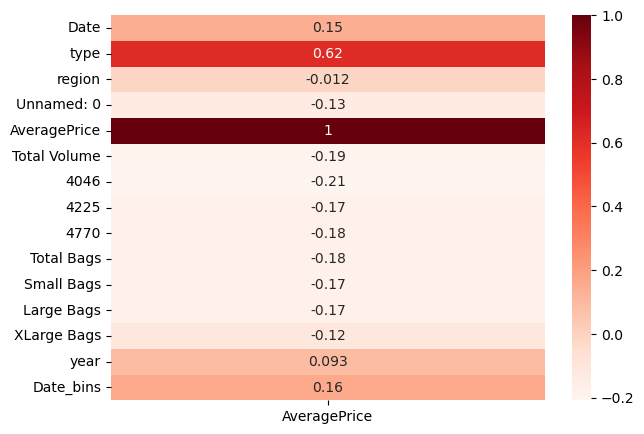

In [243]:
#### Correlación de Pearson/Spearman

target_correlation = df.corr(method='pearson')[['AveragePrice']]  # method = 'spearman'

plt.figure(figsize=(7,5))
sns.heatmap(target_correlation, annot=True, cmap=plt.cm.Reds)
plt.show()

In [249]:
target_correlation[abs(target_correlation)>0.5].dropna().sort_values('AveragePrice', ascending=False)

,AveragePrice
AveragePrice,1.000000
type,0.615852


##### Métodos de envoltura (Wrapper Methods)
- Selecciona un subset de features en base a su mejor desempeño al compararlo con otros subsets.
  - Backward selection: eliminacion sistematica de features.
  - Forward selection: adicion sistematica de features.
  - Recursive Feature Elimination: en base al desempeño de las features.
    - SequentialFeatureSelector
    - RFE

*Implica utilizar el algoritmo/estimador de ML que se va a entrenar

*Implica utilizar la métrica de evaluación que se va a usar

[Guia práctica para Feature Selection usando Wrapper Methods](https://michael-fuchs-python.netlify.app/2019/09/27/wrapper-methods/)

In [250]:
from sklearn.feature_selection import SequentialFeatureSelector, RFE


In [251]:
help(SequentialFeatureSelector)

Help on class SequentialFeatureSelector in module sklearn.feature_selection._sequential:

class SequentialFeatureSelector(sklearn.feature_selection._base.SelectorMixin, sklearn.base.MetaEstimatorMixin, sklearn.base.BaseEstimator)
 |  SequentialFeatureSelector(estimator, *, n_features_to_select='auto', tol=None, direction='forward', scoring=None, cv=5, n_jobs=None)
 |  
 |  Transformer that performs Sequential Feature Selection.
 |  
 |  This Sequential Feature Selector adds (forward selection) or
 |  removes (backward selection) features to form a feature subset in a
 |  greedy fashion. At each stage, this estimator chooses the best feature to
 |  add or remove based on the cross-validation score of an estimator. In
 |  the case of unsupervised learning, this Sequential Feature Selector
 |  looks only at the features (X), not the desired outputs (y).
 |  
 |  Read more in the :ref:`User Guide <sequential_feature_selection>`.
 |  
 |  .. versionadded:: 0.24
 |  
 |  Parameters
 |  -----

In [252]:
help(RFE)

Help on class RFE in module sklearn.feature_selection._rfe:

class RFE(sklearn.feature_selection._base.SelectorMixin, sklearn.base.MetaEstimatorMixin, sklearn.base.BaseEstimator)
 |  RFE(estimator, *, n_features_to_select=None, step=1, verbose=0, importance_getter='auto')
 |  
 |  Feature ranking with recursive feature elimination.
 |  
 |  Given an external estimator that assigns weights to features (e.g., the
 |  coefficients of a linear model), the goal of recursive feature elimination
 |  (RFE) is to select features by recursively considering smaller and smaller
 |  sets of features. First, the estimator is trained on the initial set of
 |  features and the importance of each feature is obtained either through
 |  any specific attribute or callable.
 |  Then, the least important features are pruned from current set of features.
 |  That procedure is recursively repeated on the pruned set until the desired
 |  number of features to select is eventually reached.
 |  
 |  Read more in

##### Métodos embebidos (Embedded Methods)
- Consiste en aplicar una regresión lineal regularizada: evita que el modelo entrene con features demasiado complejas para que generalice mejor.
  - LASSO
  - Ridge
  - Elastic Net
  - etc.
- Tambien otros tipos de métodos como arboles de decision (Random Forest, etc.)
- Dará un peso a cada feature según su importancia en el modelo.

*Implica utilizar modelos de clasificación o regresión, segun nuestro caso.

*Implica utilizar la métrica de evaluación que se va a usar

[Guia práctica para Feature Selection usando Embedded Methods (Lasso, Ridge, Elastic Net)](https://michael-fuchs-python.netlify.app/2019/10/08/embedded-methods/)
- [Aplicacion de Embedded method: Random Forest](https://www.enjoyalgorithms.com/blog/feature-selection-techniques)

In [253]:
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.ensemble import RandomForestClassifier

In [254]:
help(Lasso)

Help on class Lasso in module sklearn.linear_model._coordinate_descent:

class Lasso(ElasticNet)
 |  Lasso(alpha=1.0, *, fit_intercept=True, precompute=False, copy_X=True, max_iter=1000, tol=0.0001, warm_start=False, positive=False, random_state=None, selection='cyclic')
 |  
 |  Linear Model trained with L1 prior as regularizer (aka the Lasso).
 |  
 |  The optimization objective for Lasso is::
 |  
 |      (1 / (2 * n_samples)) * ||y - Xw||^2_2 + alpha * ||w||_1
 |  
 |  Technically the Lasso model is optimizing the same objective function as
 |  the Elastic Net with ``l1_ratio=1.0`` (no L2 penalty).
 |  
 |  Read more in the :ref:`User Guide <lasso>`.
 |  
 |  Parameters
 |  ----------
 |  alpha : float, default=1.0
 |      Constant that multiplies the L1 term, controlling regularization
 |      strength. `alpha` must be a non-negative float i.e. in `[0, inf)`.
 |  
 |      When `alpha = 0`, the objective is equivalent to ordinary least
 |      squares, solved by the :class:`LinearR

In [255]:
help(RandomForestClassifier)

Help on class RandomForestClassifier in module sklearn.ensemble._forest:

class RandomForestClassifier(ForestClassifier)
 |  RandomForestClassifier(n_estimators=100, *, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='sqrt', max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None)
 |  
 |  A random forest classifier.
 |  
 |  A random forest is a meta estimator that fits a number of decision tree
 |  classifiers on various sub-samples of the dataset and uses averaging to
 |  improve the predictive accuracy and control over-fitting.
 |  The sub-sample size is controlled with the `max_samples` parameter if
 |  `bootstrap=True` (default), otherwise the whole dataset is used to build
 |  each tree.
 |  
 |  For a comparison between tree-based ensemble models see the example
 |  :ref:`sp

#### Extracción de variables (Feature extraction)

Análisis principal de componentes o Principal Component Analysis (PCA)
  - Método que busca un espacio dimensional más bajo preservando la varianza del espacio dimensional original utilizando transformaciones lineales.

[Explicación extensa y práctica de PCA paso a paso](https://www.geeksforgeeks.org/principal-component-analysis-pca/)

Total Explained Variance: 99.25%


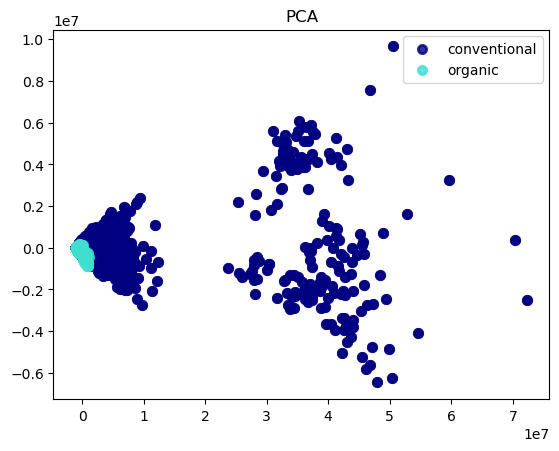

In [259]:
from sklearn.decomposition import PCA

# Division del dataset en campos/features y variable objetivo
X =df.drop('type', axis=1)
y = df.type

# Construcción del objeto PCA
pca = PCA(n_components=2)
components = pca.fit_transform(df.drop('type', axis=1)) 

# Representación 2D del PCA
total_var = pca.explained_variance_ratio_.sum() * 100
print(f'Total Explained Variance: {total_var:.2f}%') # % de varianza preservado

target_names = df.type
colors = ["navy", "turquoise", "darkorange"]
lw = 2

for color, i, target_name in zip(colors, [0, 1, 2], target_names):
    plt.scatter(
        components[y == i, 0], components[y == i, 1], color=color, alpha=0.8, lw=lw, label=target_name
    )
    
plt.legend(type, loc="best", shadow=False, scatterpoints=1)
plt.title("PCA")
plt.show()

In [260]:
import plotly.express as px

pca = PCA(n_components=3)
components = pca.fit_transform(df.drop('type', axis=1)) 

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=df['type'],
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

#### Análisis discriminatorio lineal o Linear Discriminant Analysis (LDA)
- Método que se usa para encontrar una combinación lineal de features en un dataset. 

[Explicación extensa y práctica de LDA paso a paso](https://medium.com/accel-ai/lda-algorithm-tutorial-in-python-57ee62e71965)

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis(n_components=2)
components = lda.fit_transform(X=X, y=y) 

total_var = lda.explained_variance_ratio_.sum() * 100
print(f'Total Explained Variance: {total_var:.2f}%')

for color, i, target_name in zip(colors, [0, 1, 2], target_names):
    plt.scatter(
        components[y == i, 0], components[y == i, 1], color=color, alpha=0.8, lw=lw, label=target_name
    )

plt.legend(type, loc="best", shadow=False, scatterpoints=1)
plt.title("LDA")
plt.show()

#### Análisis discriminatorio generalizado/gaussiano o Generalized/Gaussian Discriminant Analysis (GDA)
- método basado en el LDA que asume que las diferentes clases siguen una distribución Gaussiana o normal, además de no asumir que las matrices de covarianza son iguales.

[Explicación matemática de GDA](https://www.geeksforgeeks.org/gaussian-discriminant-analysis/)

### 4.5. Ingeniería de variables

- Consiste en la creación de nuevas variables o features a partir de las features originales.
- Objetivo: obtener features más valiosas/significativas que ayuden a mejorar el desempeño del modelo de ML.
- Requiere de análisis e imaginación.
- Este termino también puede englobar el proceso completo de todas las secciones anteriores o sinónimo del data preparation.


In [264]:
df.columns

Index(['Date', 'type', 'region', 'Unnamed: 0', 'AveragePrice', 'Total Volume',
       '4046', '4225', '4770', 'Total Bags', 'Small Bags', 'Large Bags',
       'XLarge Bags', 'year', 'Date_bins'],
      dtype='object')

In [ ]:
df_2 = pd.read_csv('penguins_lter.csv')
df_2.columns.tolist()

<img src="https://fossilpenguins.files.wordpress.com/2012/01/thomas.jpg" width="800">

<img src="https://royalsocietypublishing.org/cms/asset/751e0c57-b3cb-417a-a154-8a0b24770e7a/rspb20152033f03.jpg" width="800">

[Body Girth as an Alternative to Body Mass for Establishing Condition Indexes in Field Studies: A Validation in the King Penguin](https://www.researchgate.net/figure/Relationship-between-body-mass-M-b-and-body-girth-G-b-in-king-penguins-Data-are_fig1_259711305)

#### Analisis bivariable

In [ ]:
import seaborn as sns

%matplotlib inline

sns.pairplot(df.select_dtypes(include=np.number), hue="species")

In [ ]:
print('Covariance:')
df.cov()

In [ ]:
print('Correlation:')
df.corr()

In [ ]:
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True)

#### Crear nuevas variables

In [ ]:
# body mass/ flipper length (g/mm): densidad del ala
df['body_mass_flipper_length_ratio'] = df['body_mass_g'] / df['flipper_length_mm']

In [ ]:
print('min: ', df['body_mass_flipper_length_ratio'].min())
print('max: ',df['body_mass_flipper_length_ratio'].max())

In [ ]:
fig, ax =plt.subplots(1,2)

df.groupby("species").body_mass_flipper_length_ratio.plot(kind='kde', figsize=(10, 3), ax=ax[1])
df.groupby("species").body_mass_flipper_length_ratio.hist(figsize=(10, 3), ax=ax[0])

plt.legend()
;

In [ ]:
# body mass/ culem length (g/mm): densidad del pico
df['culem_length_flipper_length_ratio'] = df['culmen_length_mm'] / df['flipper_length_mm']

fig, ax =plt.subplots(1,2)

df.groupby("species").culem_length_flipper_length_ratio.plot(kind='kde', figsize=(10, 3), ax=ax[1])
df.groupby("species").culem_length_flipper_length_ratio.hist(figsize=(10, 3), ax=ax[0])

plt.legend()

In [ ]:
df['body_mass_culem_length_ratio'] = df['body_mass_g'] / df['culmen_length_mm']

fig, ax =plt.subplots(1,2)

df.groupby("species").body_mass_culem_length_ratio.plot(kind='kde', figsize=(10, 3), ax=ax[1])
df.groupby("species").body_mass_culem_length_ratio.hist(figsize=(10, 3), ax=ax[0])

plt.legend()

In [ ]:
X = df[['body_mass_flipper_length_ratio', 'body_mass_culem_length_ratio', 'species']]

sns.scatterplot(x='body_mass_culem_length_ratio', y='body_mass_flipper_length_ratio', data=X, hue='species')

plt.show()

In [ ]:
import plotly.express as px

X = df[['body_mass_flipper_length_ratio', 'body_mass_culem_length_ratio', 'culem_length_flipper_length_ratio', 'species']]
y = df.species

fig = px.scatter_3d(
    X, x="body_mass_flipper_length_ratio", y="body_mass_culem_length_ratio", z="culem_length_flipper_length_ratio", color=df['species'],
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'body_mass_flipper_length_ratio': 'body mass/flipper len',
            'body_mass_culem_length_ratio': 'body mass/culem len',
            'culem_length_flipper_length_ratio': 'culem length/flipper len'}
)
fig.show()

## 5. Separación de datos (Data Splitting)
- Su proposito es:
1. Disponer de datos no usados en entrenamiento para evaluar el desempeño del modelo.
2. Evitar el *overfitting*/sobreajuste del modelo: el modelo no generaliza bien o esta extremadamente ajustado a los datos de entrenamiento.

- Necesario en cualquier modelo que realice predicciones sobretodo para Supervised Learning:
  - Clasificacion o Regresion

- Pero tambien puede usarse en Unsupervised Learning dependiendo del algoritmo usado:
  - Los que usen centroides para realizar predicciones (K-means)
  - Deteccion de anomalias/outliers (Datos normales: clase "1", outliers: clase"-1").
  - etc.

- División en diferentes grupos o subsets:
  - Entrenamiento (train):para entrenar al modelo de ML.
  - Validación (validation o val): para evaluar el desempeño o performance del modelo de ML durante el entrenamiento.
  - Test: para evaluar el desempeño del modelo entrenado.

In [ ]:
df

In [265]:
df.region.value_counts().plot(kind='bar', rot=0)

<Axes: xlabel='region'>

### Sampleo aleatorio: Ramdom sampling

In [266]:
from sklearn.model_selection import train_test_split

X, y = df.drop('region', axis=1), df.region

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED)

print('train: ', X_train.shape)
print('test: ', X_test.shape)

train:  (14598, 14)
test:  (3650, 14)


In [267]:
y_train.value_counts().plot(kind='bar', rot=0)

<Axes: xlabel='region'>

In [268]:
y_test.value_counts().plot(kind='bar', rot=0)

<Axes: xlabel='region'>

In [269]:
train_ratio = 0.8
val_ratio = 0.15
test_ratio = 0.1

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1-train_ratio, random_state=SEED)

X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=test_ratio/(test_ratio + val_ratio), random_state=SEED)
    
print('train: ', X_train.shape)
print('val: ', X_val.shape)
print('test: ', X_test.shape)

train:  (14598, 14)
val:  (1460, 14)
test:  (2190, 14)


In [270]:
y_train.value_counts().plot(kind='bar', rot=0)

<Axes: xlabel='region'>

In [271]:
y_test.value_counts().plot(kind='bar', rot=0)

<Axes: xlabel='region'>

### Sampleo estratificado (Stratified sampling)
-  Separación basada en las etiquetas/clases/labels + división aleatoria

In [272]:
from sklearn.model_selection import train_test_split

X, y = df.drop('region', axis=1), df.region

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=SEED)

print('train: ', X_train.shape)
print('test: ', X_test.shape)

train:  (14598, 14)
test:  (3650, 14)


In [273]:
y_train.value_counts().plot(kind='bar', rot=0)

<Axes: xlabel='region'>

In [274]:
y_test.value_counts().plot(kind='bar', rot=0)

<Axes: xlabel='region'>

In [275]:
train_ratio = 0.8
val_ratio = 0.15
test_ratio = 0.1

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1-train_ratio, stratify=y, random_state=SEED)

X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=test_ratio/(test_ratio + val_ratio), stratify=y_test, random_state=SEED)
    
print('train: ', X_train.shape)
print('val: ', X_val.shape)
print('test: ', X_test.shape)

train:  (14598, 14)
val:  (1460, 14)
test:  (2190, 14)


In [276]:
y_train.value_counts().plot(kind='bar', rot=0)

<Axes: xlabel='region'>

In [277]:
y_test.value_counts().plot(kind='bar', rot=0)

<Axes: xlabel='region'>

### *Time-based sampling
- Los datos son separados en función de diferentes rangos de fechas.
- Es crucial que datos del "pasado" aparezcan en el "futuro":
  - Las fechas del split train no pueden ser mayores que las del split val o test.
  - Las fechas del split val no pueden ser mayores que las del split test.
  - Las fechas del split test deben ser mayores que las de train y val.

In [279]:
df_avocado = pd.read_csv('data/avocado.csv')

In [ ]:
df_avocado

In [280]:
df_avocado.sort_values(by='Date', ascending=True, inplace=True)

In [281]:
df_avocado

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
11569,51,2015-01-04,1.75,27365.89,9307.34,3844.81,615.28,13598.46,13061.10,537.36,0.00,organic,2015,Southeast
9593,51,2015-01-04,1.49,17723.17,1189.35,15628.27,0.00,905.55,905.55,0.00,0.00,organic,2015,Chicago
10009,51,2015-01-04,1.68,2896.72,161.68,206.96,0.00,2528.08,2528.08,0.00,0.00,organic,2015,HarrisburgScranton
1819,51,2015-01-04,1.52,54956.80,3013.04,35456.88,1561.70,14925.18,11264.80,3660.38,0.00,conventional,2015,Pittsburgh
9333,51,2015-01-04,1.64,1505.12,1.27,1129.50,0.00,374.35,186.67,187.68,0.00,organic,2015,Boise
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8574,0,2018-03-25,1.36,908202.13,142681.06,463136.28,174975.75,127409.04,103579.41,22467.04,1362.59,conventional,2018,Chicago
9018,0,2018-03-25,0.70,9010588.32,3999735.71,966589.50,30130.82,4014132.29,3398569.92,546409.74,69152.63,conventional,2018,SouthCentral
18141,0,2018-03-25,1.42,163496.70,29253.30,5080.04,0.00,129163.36,109052.26,20111.10,0.00,organic,2018,SouthCentral
17673,0,2018-03-25,1.70,190257.38,29644.09,70982.10,0.00,89631.19,89424.11,207.08,0.00,organic,2018,California


In [282]:
train_frac = 0.8

train = df_avocado.iloc[0:int(df.shape[0]*train_frac), :]
test = df_avocado.iloc[int(df.shape[0]*train_frac):, :]

In [283]:
train

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
11569,51,2015-01-04,1.75,27365.89,9307.34,3844.81,615.28,13598.46,13061.10,537.36,0.00,organic,2015,Southeast
9593,51,2015-01-04,1.49,17723.17,1189.35,15628.27,0.00,905.55,905.55,0.00,0.00,organic,2015,Chicago
10009,51,2015-01-04,1.68,2896.72,161.68,206.96,0.00,2528.08,2528.08,0.00,0.00,organic,2015,HarrisburgScranton
1819,51,2015-01-04,1.52,54956.80,3013.04,35456.88,1561.70,14925.18,11264.80,3660.38,0.00,conventional,2015,Pittsburgh
9333,51,2015-01-04,1.64,1505.12,1.27,1129.50,0.00,374.35,186.67,187.68,0.00,organic,2015,Boise
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14815,21,2017-08-06,1.97,13998.62,451.86,5641.82,0.00,7904.94,5936.32,1968.62,0.00,organic,2017,Atlanta
16140,21,2017-08-06,1.54,8077.28,71.27,2677.74,0.00,5328.27,2337.43,2990.84,0.00,organic,2017,Nashville
7227,21,2017-08-06,1.59,462412.85,7918.05,369483.25,4703.97,80307.58,22061.56,55252.69,2993.33,conventional,2017,NorthernNewEngland
16670,21,2017-08-06,2.14,27316.23,8822.05,3672.50,18.46,14803.22,2466.44,12336.78,0.00,organic,2017,Portland


In [284]:
test

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
17571,21,2017-08-06,1.78,15242.53,2134.24,4592.66,331.60,8184.03,8171.22,12.81,0.00,organic,2017,WestTexNewMexico
16776,21,2017-08-06,1.66,12743.98,513.56,3881.12,71.87,8277.43,7343.81,933.62,0.00,organic,2017,RichmondNorfolk
15557,21,2017-08-06,1.65,125026.87,3724.58,32794.35,4.87,88319.69,67919.34,20400.35,0.00,organic,2017,GreatLakes
15610,21,2017-08-06,1.63,13641.10,253.23,179.45,5.72,13202.70,13199.48,3.22,0.00,organic,2017,HarrisburgScranton
5743,21,2017-08-06,1.47,695848.77,60785.37,440986.27,5324.79,188752.34,182988.33,1830.67,3933.34,conventional,2017,BaltimoreWashington
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8574,0,2018-03-25,1.36,908202.13,142681.06,463136.28,174975.75,127409.04,103579.41,22467.04,1362.59,conventional,2018,Chicago
9018,0,2018-03-25,0.70,9010588.32,3999735.71,966589.50,30130.82,4014132.29,3398569.92,546409.74,69152.63,conventional,2018,SouthCentral
18141,0,2018-03-25,1.42,163496.70,29253.30,5080.04,0.00,129163.36,109052.26,20111.10,0.00,organic,2018,SouthCentral
17673,0,2018-03-25,1.70,190257.38,29644.09,70982.10,0.00,89631.19,89424.11,207.08,0.00,organic,2018,California


In [285]:
train_frac = 0.8
val_frac = 0.15
test_frac = 0.1

train_row_limit = int(df.shape[0]*train_frac)
val_row_limit = train_row_limit + int(df.shape[0]*val_frac)

train = df_avocado.iloc[0:train_row_limit, :]
val = df_avocado.iloc[train_row_limit: val_row_limit, :]
test = df_avocado.iloc[val_row_limit:df.shape[0], :]

In [286]:
train.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
11569,51,2015-01-04,1.75,27365.89,9307.34,3844.81,615.28,13598.46,13061.10,537.36,0.0,organic,2015,Southeast
9593,51,2015-01-04,1.49,17723.17,1189.35,15628.27,0.00,905.55,905.55,0.00,0.0,organic,2015,Chicago
10009,51,2015-01-04,1.68,2896.72,161.68,206.96,0.00,2528.08,2528.08,0.00,0.0,organic,2015,HarrisburgScranton
1819,51,2015-01-04,1.52,54956.80,3013.04,35456.88,1561.70,14925.18,11264.80,3660.38,0.0,conventional,2015,Pittsburgh
9333,51,2015-01-04,1.64,1505.12,1.27,1129.50,0.00,374.35,186.67,187.68,0.0,organic,2015,Boise


In [287]:
train.tail()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
14815,21,2017-08-06,1.97,13998.62,451.86,5641.82,0.00,7904.94,5936.32,1968.62,0.00,organic,2017,Atlanta
16140,21,2017-08-06,1.54,8077.28,71.27,2677.74,0.00,5328.27,2337.43,2990.84,0.00,organic,2017,Nashville
7227,21,2017-08-06,1.59,462412.85,7918.05,369483.25,4703.97,80307.58,22061.56,55252.69,2993.33,conventional,2017,NorthernNewEngland
16670,21,2017-08-06,2.14,27316.23,8822.05,3672.50,18.46,14803.22,2466.44,12336.78,0.00,organic,2017,Portland
5796,21,2017-08-06,1.54,73710.09,37252.55,3802.70,7644.86,25009.98,16530.36,8380.66,98.96,conventional,2017,Boise


In [288]:
val.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
17571,21,2017-08-06,1.78,15242.53,2134.24,4592.66,331.60,8184.03,8171.22,12.81,0.00,organic,2017,WestTexNewMexico
16776,21,2017-08-06,1.66,12743.98,513.56,3881.12,71.87,8277.43,7343.81,933.62,0.00,organic,2017,RichmondNorfolk
15557,21,2017-08-06,1.65,125026.87,3724.58,32794.35,4.87,88319.69,67919.34,20400.35,0.00,organic,2017,GreatLakes
15610,21,2017-08-06,1.63,13641.10,253.23,179.45,5.72,13202.70,13199.48,3.22,0.00,organic,2017,HarrisburgScranton
5743,21,2017-08-06,1.47,695848.77,60785.37,440986.27,5324.79,188752.34,182988.33,1830.67,3933.34,conventional,2017,BaltimoreWashington


In [289]:
val.tail()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
8750,8,2018-01-28,1.08,2893717.97,1134192.09,707838.42,81296.65,970390.81,911703.94,16595.96,42090.91,conventional,2018,LosAngeles
17921,8,2018-01-28,1.63,6610.16,41.96,2301.94,0.00,4266.26,2704.59,1561.67,0.00,organic,2018,Nashville
8522,8,2018-01-28,1.12,105025.45,66653.80,1971.68,6961.61,29438.36,20717.06,8682.47,38.83,conventional,2018,Boise
18197,8,2018-01-28,1.19,6393.58,30.09,128.49,0.00,6235.00,5670.94,564.06,0.00,organic,2018,Syracuse
17657,8,2018-01-28,1.72,30846.35,14.65,1628.45,0.00,29203.25,27876.23,1327.02,0.00,organic,2018,Boston


In [290]:
test.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
8834,8,2018-01-28,1.23,5680957.63,418911.03,3730287.55,8112.22,1523646.83,1278588.12,242866.49,2192.22,conventional,2018,Northeast
8510,8,2018-01-28,1.12,1152539.42,115283.70,805041.45,4257.45,227956.82,225931.13,2019.02,6.67,conventional,2018,BaltimoreWashington
8990,8,2018-01-28,1.38,821352.05,246496.88,418612.30,2588.33,153654.54,150232.81,402.62,3019.11,conventional,2018,SanFrancisco
17741,8,2018-01-28,1.45,26069.14,4936.84,476.06,0.00,20656.24,19613.20,1043.04,0.00,organic,2018,DallasFtWorth
8870,8,2018-01-28,1.23,537883.88,90381.50,256525.12,390.07,190587.19,183977.34,6289.85,320.00,conventional,2018,Philadelphia


### Validación cruzada (Cross-validation)
- Los datos son separados en múltiples subsets o folds.
- Algunos de estos folds se usan para entrenar el modelo mientras otros se usan para evaluar su desempeño.
- La ventaja principal de la validación cruzada es que podemos usar todos los datos disponibles.

#### Hold-out cross validation
- Sampleo aleatorio, dividiendo el dataset en entrenamiento, validación y test o en entrenamiento y test.


<img src="https://editor.analyticsvidhya.com/uploads/18265Screenshot-from-2020-10-06-16-35-50-768x432.png" width="800">
;

- K-fold cross-validation
  - El conjunto de datos se separa en k partes/folds del mismo tamaño.
  - Se realizan n iteraciones donde n es el número de folds
  - Con este acercamiento utilizamos todos los datos como test eventualmente
    - Disminuye la varianza
    - Generaliza mejor el modelo

<img src="https://user-images.githubusercontent.com/26833433/258589390-8d815058-ece8-48b9-a94e-0e1ab53ea0f6.png" width="800">
;

In [292]:
from sklearn.model_selection import KFold

X = df.drop('region', axis=1)
y = df.region
n_splits = 5
cv = KFold(n_splits=n_splits, shuffle=True, random_state=SEED)
fold_count = 1

for train_index, test_index in cv.split(X, y):
    print(f'Fold:{fold_count}, Train set: {len(train_index)}, Test set:{len(test_index)}')
    fold_count += 1

Fold:1, Train set: 14598, Test set:3650
Fold:2, Train set: 14598, Test set:3650
Fold:3, Train set: 14598, Test set:3650
Fold:4, Train set: 14599, Test set:3649
Fold:5, Train set: 14599, Test set:3649


In [294]:
def plot_cv_indices(cv, X, y, group, ax, n_splits, lw=10):
    """Create a sample plot for indices of a cross-validation object."""

    # Generate the training/testing visualizations for each CV split
    for ii, (tr, tt) in enumerate(cv.split(X=X, y=y, groups=group)):
        # Fill in indices with the training/test groups
        indices = np.array([np.nan] * len(X))
        indices[tt] = 1
        
        indices[tr] = 0

        # Visualize the results
        ax.scatter(
            range(len(indices)),
            [ii + 0.5] * len(indices),
            c=indices,
            marker="_",
            lw=lw,
            cmap=cmap_cv,
            vmin=-0.2,
            vmax=1.2,
        )

    # Plot the data classes and groups at the end
    ax.scatter(
        range(len(X)), [ii + 1.5] * len(X), c=y, marker="_", lw=lw, cmap=cmap_data
    )

    ax.scatter(
        range(len(X)), [ii + 2.5] * len(X), c=group, marker="_", lw=lw, cmap=cmap_data
    )

    # Formatting
    yticklabels = list(range(n_splits)) + ["class", "group"]
    ax.set(
        yticks=np.arange(n_splits + 2) + 0.5,
        yticklabels=yticklabels,
        xlabel="Sample index",
        ylabel="CV iteration",
        ylim=[n_splits + 2.2, -0.2],
        xlim=[0, df.shape[0]],
    )
    ax.set_title("{}".format(type(cv).__name__), fontsize=15)
    return ax


rng = np.random.RandomState(SEED)
cmap_data = plt.cm.Paired
cmap_cv = plt.cm.coolwarm

group_prior = rng.dirichlet([2] * df.shape[1])
groups = np.repeat(np.arange(df.shape[1]), rng.multinomial(df.shape[0], group_prior))  # Generate uneven groups

fig, ax = plt.subplots()
cv = KFold(n_splits)
plot_cv_indices(cv, X, y, groups, ax, n_splits)

TypeError: 'list' object is not callable

In [295]:
cv

KFold(n_splits=5, random_state=None, shuffle=False)

In [ ]:
from sklearn.model_selection import cross_val_score

help(cross_val_score)

[Mas ejemplos prácticos de entrenamiento de models con Cross Validation](https://www.kaggle.com/code/satishgunjal/tutorial-k-fold-cross-validation)

#### Leave-one-out cross-validation
- El modelo de ML es entrenado n veces donde n es el tamaño de observaciones en el dataset.
- En cada iteración, sólo una muestra/observación es usada como test y el resto se utiliza como entrenamiento.
- Utilizar el máximo número de observaciones posibles para el entrenamiento.

In [302]:
from sklearn.model_selection import LeaveOneOut

X = df.drop('type', axis=1)
y = df.type

cv = LeaveOneOut()

for i, (train_index, test_index) in enumerate(cv.split(X)):
    print(f"Fold {i}:")
    print(f"  Train: index={train_index}")
    print(f"  Test:  index={test_index}")

Fold 0:
  Train: index=[    1     2     3 ... 18245 18246 18247]
  Test:  index=[0]
Fold 1:
  Train: index=[    0     2     3 ... 18245 18246 18247]
  Test:  index=[1]
Fold 2:
  Train: index=[    0     1     3 ... 18245 18246 18247]
  Test:  index=[2]
Fold 3:
  Train: index=[    0     1     2 ... 18245 18246 18247]
  Test:  index=[3]
Fold 4:
  Train: index=[    0     1     2 ... 18245 18246 18247]
  Test:  index=[4]
Fold 5:
  Train: index=[    0     1     2 ... 18245 18246 18247]
  Test:  index=[5]
Fold 6:
  Train: index=[    0     1     2 ... 18245 18246 18247]
  Test:  index=[6]
Fold 7:
  Train: index=[    0     1     2 ... 18245 18246 18247]
  Test:  index=[7]
Fold 8:
  Train: index=[    0     1     2 ... 18245 18246 18247]
  Test:  index=[8]
Fold 9:
  Train: index=[    0     1     2 ... 18245 18246 18247]
  Test:  index=[9]
Fold 10:
  Train: index=[    0     1     2 ... 18245 18246 18247]
  Test:  index=[10]
Fold 11:
  Train: index=[    0     1     2 ... 18245 18246 18247]
  Test: 


<img src="https://www.researchgate.net/publication/344613547/figure/fig1/AS:1023136136978433@1620946072240/Schematic-representation-of-the-leave-one-out-cross-validation-LOOCV-method.ppm" width="800">
